In [1]:
import pandas as pd
import numpy as np
import io
from sklearn.tree import DecisionTreeClassifier  
from sklearn.ensemble import RandomForestClassifier  
from sklearn.linear_model import LogisticRegression  
from sklearn.neighbors import KNeighborsClassifier 
from sklearn.metrics import (accuracy_score, precision_score, recall_score,
                             f1_score, roc_auc_score, confusion_matrix,
                             classification_report, r2_score, mean_absolute_error,
                             mean_squared_error, roc_curve, auc, precision_recall_curve)
from sklearn.model_selection import (GridSearchCV, train_test_split, learning_curve,
                                     StratifiedKFold, cross_val_score)

from sklearn.preprocessing import StandardScaler, LabelBinarizer, OneHotEncoder
from sklearn.compose import ColumnTransformer
from sklearn.calibration import label_binarize
import matplotlib.pyplot as plt  
import seaborn as sns 
import matplotlib.lines as mlines  
import matplotlib.patches as patches 
from imblearn.over_sampling import SMOTE 



In [2]:
import pandas as pd

df = pd.read_csv("PSP_Jan_Feb_2019.csv")

print(df.head())

print("Dataset Shape:", df.shape)

   Unnamed: 0                 tmsp  country  amount  success         PSP  \
0           0  2019-01-01 00:01:11  Germany      89        0     UK_Card   
1           1  2019-01-01 00:01:17  Germany      89        1     UK_Card   
2           2  2019-01-01 00:02:49  Germany     238        0     UK_Card   
3           3  2019-01-01 00:03:13  Germany     238        1     UK_Card   
4           4  2019-01-01 00:04:33  Austria     124        0  Simplecard   

   3D_secured    card  
0           0    Visa  
1           0    Visa  
2           1  Diners  
3           1  Diners  
4           0  Diners  
Dataset Shape: (50410, 8)


In [3]:
print("Data Types:\n", df.dtypes)

Data Types:
 Unnamed: 0     int64
tmsp          object
country       object
amount         int64
success        int64
PSP           object
3D_secured     int64
card          object
dtype: object


In [4]:
# Check for missing values
print("Missing Values:\n", df.isnull().sum())

Missing Values:
 Unnamed: 0    0
tmsp          0
country       0
amount        0
success       0
PSP           0
3D_secured    0
card          0
dtype: int64


In [5]:
# Check for duplicate rows
duplicates = df[df.duplicated()]
print("Number of Duplicate Rows:", duplicates.shape[0])

Number of Duplicate Rows: 0


In [6]:
# Check for unique values in categorical columns to spot inconsistencies
print("Unique Values in 'country':\n", df['country'].unique())
print("Unique Values in 'PSP':\n", df['PSP'].unique())
print("Unique Values in 'card':\n", df['card'].unique())


Unique Values in 'country':
 ['Germany' 'Austria' 'Switzerland']
Unique Values in 'PSP':
 ['UK_Card' 'Simplecard' 'Moneycard' 'Goldcard']
Unique Values in 'card':
 ['Visa' 'Diners' 'Master']


In [7]:
#Dropint hr "Unnamed: 0" column form the Data Frame
df =df.drop('Unnamed: 0', axis=1)
# Print the remaining columns after dropping 'Unnamed: 0'
print(df.head())

                  tmsp  country  amount  success         PSP  3D_secured  \
0  2019-01-01 00:01:11  Germany      89        0     UK_Card           0   
1  2019-01-01 00:01:17  Germany      89        1     UK_Card           0   
2  2019-01-01 00:02:49  Germany     238        0     UK_Card           1   
3  2019-01-01 00:03:13  Germany     238        1     UK_Card           1   
4  2019-01-01 00:04:33  Austria     124        0  Simplecard           0   

     card  
0    Visa  
1    Visa  
2  Diners  
3  Diners  
4  Diners  


In [8]:
# Summary statistics to check for any outliers or unusual distributions
print("Summary Statistics:\n", df.describe())

Summary Statistics:
              amount       success    3D_secured
count  50410.000000  50410.000000  50410.000000
mean     202.395715      0.202896      0.238266
std       96.274730      0.402160      0.426027
min        6.000000      0.000000      0.000000
25%      133.000000      0.000000      0.000000
50%      201.000000      0.000000      0.000000
75%      269.000000      0.000000      0.000000
max      630.000000      1.000000      1.000000


In [9]:
import plotly.express as px

# Plot the distribution of success
fig = px.histogram(df, x='success', title='Distribution of Transaction Success', 
                   labels={'success': 'Transaction Success'}, 
                   color_discrete_sequence=['#636EFA'])

fig.update_layout(bargap=0.2)
fig.show()



In [10]:
# Calculate the success rate for each PSP
psp_success_rate = df.groupby('PSP')['success'].mean().reset_index().sort_values(by='success', ascending=False)

# Plot the success rate for each PSP
fig = px.bar(psp_success_rate, x='PSP', y='success', 
             title='Success Rate by PSP', 
             labels={'success': 'Success Rate', 'PSP': 'Payment Service Provider'}, 
             color='PSP', 
             color_discrete_sequence=px.colors.qualitative.G10)

fig.update_layout(xaxis={'categoryorder': 'total descending'})
fig.show()


In [11]:
# Plot the distribution of transaction amounts
fig = px.histogram(df, x='amount', nbins=70, title='Distribution of Transaction Amounts', 
                   labels={'amount': 'Transaction Amount'}, 
                   color_discrete_sequence=['#00CC96'])

fig.update_layout(bargap=0.1)
fig.show()

# Analyze the relationship between amount and success
fig = px.box(df, x='success', y='amount', title='Transaction Amount vs Success', 
             labels={'success': 'Transaction Success', 'amount': 'Transaction Amount'}, 
             color='success', 
             color_discrete_sequence=['#EF553B', '#636EFA'])

fig.show()


In [12]:
# Success rate by country
country_success_rate = df.groupby('country')['success'].mean().reset_index().sort_values(by='success', ascending=False)

# Plot success rate by country
fig = px.bar(country_success_rate, x='country', y='success', 
             title='Success Rate by Country', 
             labels={'success': 'Success Rate', 'country': 'Country'}, 
             color='country', 
             color_discrete_sequence=px.colors.qualitative.Pastel)

fig.update_layout(xaxis={'categoryorder': 'total descending'})
fig.show()


In [13]:
# Success rate by 3D secured status
fig = px.histogram(df, x='3D_secured', color='success', 
                   barmode='group', 
                   title='Success Rate by 3D Secured Status', 
                   labels={'3D_secured': '3D Secured', 'success': 'Transaction Success'}, 
                   color_discrete_sequence=px.colors.qualitative.G10)

fig.show()

# Success rate by card type
fig = px.histogram(df, x='card', color='success', 
                   barmode='group', 
                   title='Success Rate by Card Type', 
                   labels={'card': 'Card Type', 'success': 'Transaction Success'}, 
                   color_discrete_sequence=px.colors.qualitative.Vivid)

fig.show()


In [14]:
from sklearn.preprocessing import LabelEncoder

# Create a copy of the dataset to avoid altering the original one
df_encoded = df.copy()

# Encode categorical variables
label_encoders = {}
for column in ['country', 'PSP', 'card']:
    label_encoders[column] = LabelEncoder()
    df_encoded[column] = label_encoders[column].fit_transform(df_encoded[column])

# Display the first few rows of the encoded dataset
print(df_encoded.head())


                  tmsp  country  amount  success  PSP  3D_secured  card
0  2019-01-01 00:01:11        1      89        0    3           0     2
1  2019-01-01 00:01:17        1      89        1    3           0     2
2  2019-01-01 00:02:49        1     238        0    3           1     0
3  2019-01-01 00:03:13        1     238        1    3           1     0
4  2019-01-01 00:04:33        0     124        0    2           0     0


In [15]:
# Calculate the correlation matrix
correlation_matrix = df_encoded.corr()

# Display the correlation matrix
print("Correlation Matrix:\n", correlation_matrix)


Correlation Matrix:
              country    amount   success       PSP  3D_secured      card
country     1.000000 -0.002327  0.000995 -0.005694   -0.007500 -0.001327
amount     -0.002327  1.000000 -0.086423  0.002546    0.000178  0.001566
success     0.000995 -0.086423  1.000000 -0.086926    0.059284 -0.009918
PSP        -0.005694  0.002546 -0.086926  1.000000   -0.004081  0.007622
3D_secured -0.007500  0.000178  0.059284 -0.004081    1.000000 -0.013314
card       -0.001327  0.001566 -0.009918  0.007622   -0.013314  1.000000


C:\Users\lm10_\AppData\Local\Temp\ipykernel_5164\3433011529.py:2: FutureWarning:

The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.



In [16]:
# Drop unnamed columns, if any (usually they have empty column names)
df_encoded = df_encoded.loc[:, ~df_encoded.columns.str.contains('^Unnamed')]

# Verify the columns in the dataframe
print("Columns after removing unnamed columns:\n", df_encoded.columns)



Columns after removing unnamed columns:
 Index(['tmsp', 'country', 'amount', 'success', 'PSP', '3D_secured', 'card'], dtype='object')


In [17]:
import numpy as np
import plotly.graph_objects as go

# Calculate the correlation matrix again after dropping the unnamed column
correlation_matrix = df_encoded.corr()

# Create a heatmap of the correlation matrix with a different colorscale and annotated values
fig = go.Figure(data=go.Heatmap(
        z=correlation_matrix.values,
        x=correlation_matrix.columns,
        y=correlation_matrix.columns,
        colorscale='inferno',  # Changed colorscale to 'Cividis'
        zmin=-1, zmax=1,  # Set min and max values for better contrast
        text=np.round(correlation_matrix.values, 2),  # Round correlation values to 2 decimal places
        hoverinfo='text',  # Show values on hover
        showscale=True,
        colorbar=dict(title="Correlation")
    ))

# Adding text annotations in the heatmap boxes
for i in range(len(correlation_matrix)):
    for j in range(len(correlation_matrix)):
        fig.add_annotation(dict(
            x=correlation_matrix.columns[j],
            y=correlation_matrix.columns[i],
            text=str(np.round(correlation_matrix.values[i, j], 2)),
            showarrow=False,
            font=dict(color="black", size=12)
        ))

# Update layout for better readability
fig.update_layout(
    title='Correlation Matrix Heatmap with Values',
    xaxis_nticks=36,
    width=800, height=800,
    margin=dict(l=100, r=100, t=100, b=100)
)

# Show the plot
fig.show()


C:\Users\lm10_\AppData\Local\Temp\ipykernel_5164\3849321490.py:5: FutureWarning:

The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.



In [18]:
# Convert the 'tmsp' column to datetime format
df['tmsp'] = pd.to_datetime(df['tmsp'])

# Verify the conversion
print(df['tmsp'].head())


0   2019-01-01 00:01:11
1   2019-01-01 00:01:17
2   2019-01-01 00:02:49
3   2019-01-01 00:03:13
4   2019-01-01 00:04:33
Name: tmsp, dtype: datetime64[ns]


In [19]:
import plotly.graph_objs as go
import pandas as pd

# Assuming you have already read the dataset into a DataFrame called 'df'

# Convert 'tmsp' column to datetime format
df['tmsp'] = pd.to_datetime(df['tmsp'])

# Set 'tmsp' as the index of the DataFrame
df.set_index('tmsp', inplace=True)

# Resample the DataFrame by day and calculate the sum for each day
df_resampled = df.resample('D').sum()

# Calculate the failure values as 1 - success
df_resampled['failure'] = 1 - df_resampled['success']

# Reset the index to keep 'tmsp' as a column for plotting
df_resampled.reset_index(inplace=True)

# Create traces for success and failure
trace_success = go.Scatter(
    x=df_resampled['tmsp'],
    y=df_resampled['success'],
    mode='lines',
    name='Success',
    line=dict(color='green')
)

trace_failure = go.Scatter(
    x=df_resampled['tmsp'],
    y=df_resampled['failure'],
    mode='lines',
    name='Failure',
    line=dict(color='red')
)

# Combine the traces
data = [trace_success, trace_failure]

# Define the layout
layout = go.Layout(
    title='Time Series of Success and Failure',
    xaxis=dict(title='Date'),
    yaxis=dict(title='Count'),
    hovermode='closest'
)

# Create the figure and plot it
fig = go.Figure(data=data, layout=layout)
fig.show()


C:\Users\lm10_\AppData\Local\Temp\ipykernel_5164\3479798657.py:13: FutureWarning:

The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.



In [20]:
def process_transaction_fees(df):
    # Reset the index of the DataFrame
    df.reset_index(inplace=True)

    # Define dictionaries for mapping success and failure transaction fees based on card type
    success_fee_mapping = {
        'Moneycard': 5,
        'Goldcard': 10,
        'UK_Card': 3,
        'Simplecard': 1
    }
    failed_fee_mapping = {
        'Moneycard': 2,
        'Goldcard': 5,
        'UK_Card': 1,
        'Simplecard': 0.5
    }

    # Create a new column 'transaction_fee' based on success or failure, using np.where
    df['transaction_fee'] = np.where(df['success'] == 1, df['PSP'].map(success_fee_mapping),
                                      df['PSP'].map(failed_fee_mapping))

    # Print the first few rows of the updated DataFrame
    print("Associated the service fees of Payment Service Providers (PSPs) with the dataset under the column identifier 'transaction_fee' \n")
    print(df.head())

# Call the function with your DataFrame
process_transaction_fees(df)

Associated the service fees of Payment Service Providers (PSPs) with the dataset under the column identifier 'transaction_fee' 

                 tmsp  country  amount  success         PSP  3D_secured  \
0 2019-01-01 00:01:11  Germany      89        0     UK_Card           0   
1 2019-01-01 00:01:17  Germany      89        1     UK_Card           0   
2 2019-01-01 00:02:49  Germany     238        0     UK_Card           1   
3 2019-01-01 00:03:13  Germany     238        1     UK_Card           1   
4 2019-01-01 00:04:33  Austria     124        0  Simplecard           0   

     card  transaction_fee  
0    Visa              1.0  
1    Visa              3.0  
2  Diners              1.0  
3  Diners              3.0  
4  Diners              0.5  


In [21]:
# Convert 'tmsp' column to datetime format
df['tmsp'] = pd.to_datetime(df['tmsp'])
# Add 'day_of_week' column with numerical mapping (Monday 0, ..., Sunday 6)
df['day_of_week'] = df['tmsp'].dt.dayofweek
# Add 'minute_of_day' column
df['minute_of_day'] = df['tmsp'].dt.hour * 60 + df['tmsp'].dt.minute
# Print the first few rows of the updated DataFrame
print(df.head())

                 tmsp  country  amount  success         PSP  3D_secured  \
0 2019-01-01 00:01:11  Germany      89        0     UK_Card           0   
1 2019-01-01 00:01:17  Germany      89        1     UK_Card           0   
2 2019-01-01 00:02:49  Germany     238        0     UK_Card           1   
3 2019-01-01 00:03:13  Germany     238        1     UK_Card           1   
4 2019-01-01 00:04:33  Austria     124        0  Simplecard           0   

     card  transaction_fee  day_of_week  minute_of_day  
0    Visa              1.0            1              1  
1    Visa              3.0            1              1  
2  Diners              1.0            1              2  
3  Diners              3.0            1              3  
4  Diners              0.5            1              4  


In [22]:
# Sort the DataFrame by 'country', 'amount', 'day_of_week', 'minute_of_day'
df.sort_values(by=['country', 'amount', 'minute_of_day'], inplace=True)
# Create a new column 'payment_attempts' and initialize it with 1
df['payment_attempts'] = 1
# Increment the 'payment_attempts' for those rows
df['payment_attempts'] = df.groupby(['country', 'amount', 'minute_of_day']).cumcount() + 1
# Reset the DataFrame index
df.reset_index(drop=True, inplace=True)
# Display the updated DataFrame
print("Dataset Post Data Transformation \n")

print(df.head())

Dataset Post Data Transformation 

                 tmsp  country  amount  success         PSP  3D_secured  \
0 2019-01-10 03:49:12  Austria       6        0   Moneycard           0   
1 2019-01-10 03:49:37  Austria       6        0  Simplecard           0   
2 2019-02-08 05:02:33  Austria       6        0     UK_Card           0   
3 2019-02-08 05:02:37  Austria       6        0     UK_Card           0   
4 2019-02-08 05:02:39  Austria       6        0  Simplecard           0   

     card  transaction_fee  day_of_week  minute_of_day  payment_attempts  
0  Diners              2.0            3            229                 1  
1  Diners              0.5            3            229                 2  
2  Diners              1.0            4            302                 1  
3  Diners              1.0            4            302                 2  
4  Diners              0.5            4            302                 3  


In [23]:
# Drop the 'tmsp' column
df.drop('tmsp', axis=1, inplace=True)
print("Updated dataset after feature selection")
print(df.head())

Updated dataset after feature selection
   country  amount  success         PSP  3D_secured    card  transaction_fee  \
0  Austria       6        0   Moneycard           0  Diners              2.0   
1  Austria       6        0  Simplecard           0  Diners              0.5   
2  Austria       6        0     UK_Card           0  Diners              1.0   
3  Austria       6        0     UK_Card           0  Diners              1.0   
4  Austria       6        0  Simplecard           0  Diners              0.5   

   day_of_week  minute_of_day  payment_attempts  
0            3            229                 1  
1            3            229                 2  
2            4            302                 1  
3            4            302                 2  
4            4            302                 3  


In [24]:
import pandas as pd
import plotly.express as px
import plotly.graph_objects as go

def visualize_data(df):
    # Select numeric columns for summary statistics
    numeric_columns = ['transaction_fee']

    # Calculate descriptive statistics for numeric columns
    numeric_summary = df[numeric_columns].describe()

    # Transpose the summary for better readability
    transposed_summary = numeric_summary.transpose()

    # Print the transposed summary
    print("\n", transposed_summary, "\n")

    # Create a histogram to visualize the distribution of transaction fees
    fig = px.histogram(df, x='transaction_fee', nbins=10, title='Transaction Fee Histogram',
                       labels={'transaction_fee': 'Transaction Fee'})
    fig.update_layout(xaxis_title='Transaction Fee', yaxis_title='Frequency')
    fig.show()

    # Create a histogram to visualize the distribution of 'day_of_week'
    fig = px.histogram(df, x='day_of_week', category_orders={'day_of_week': ['Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Saturday', 'Sunday']},
                       title='Distribution of Day of Week', labels={'day_of_week': 'Day of Week'})
    fig.update_layout(xaxis_title='Day of Week', yaxis_title='Frequency')
    fig.show()

    # Create a histogram to visualize the distribution of 'minute_of_day'
    fig = px.histogram(df, x='minute_of_day', nbins=24, title='Distribution of Minute of Day',
                       labels={'minute_of_day': 'Minute of Day'})
    fig.update_layout(xaxis_title='Minute of Day', yaxis_title='Frequency')
    fig.show()

    # Count the occurrences of each value in the 'payment_attempts' column and sort by index
    attempt_counts = df['payment_attempts'].value_counts().sort_index()

    # Print the count of payment attempts for each value
    print(attempt_counts)

    # Create a bar chart to visualize the distribution of 'payment_attempts'
    fig = px.bar(attempt_counts.reset_index(), x='index', y='payment_attempts',
                 title='Distribution of Payment Attempts',
                 labels={'index': 'Payment Attempts', 'payment_attempts': 'Frequency'})
    fig.update_layout(xaxis_title='Payment Attempts', yaxis_title='Frequency')
    fig.show()

# Call the function with your DataFrame
visualize_data(df)



                    count      mean       std  min  25%  50%  75%   max
transaction_fee  50410.0  1.756477  1.814051  0.5  1.0  1.0  2.0  10.0 



1    37227
2    10463
3     2228
4      412
5       67
6       10
7        3
Name: payment_attempts, dtype: int64


In [25]:
# Examine unique values in 'country' column
unique_countries = df['country'].unique()
print("Unique values in 'country' column:", unique_countries)
# Examine unique values in 'PSP' column
unique_psps = df['PSP'].unique()
print("Unique values in 'PSP' column:", unique_psps)
# Examine unique values in 'card' column
unique_cards = df['card'].unique()
print("Unique values in 'card' column:", unique_cards)

Unique values in 'country' column: ['Austria' 'Germany' 'Switzerland']
Unique values in 'PSP' column: ['Moneycard' 'Simplecard' 'UK_Card' 'Goldcard']
Unique values in 'card' column: ['Diners' 'Master' 'Visa']


In [26]:
df.head()

,country,amount,success,PSP,3D_secured,card,transaction_fee,day_of_week,minute_of_day,payment_attempts
0,Austria,6,0,Moneycard,0,Diners,2.0,3,229,1
1,Austria,6,0,Simplecard,0,Diners,0.5,3,229,2
2,Austria,6,0,UK_Card,0,Diners,1.0,4,302,1
3,Austria,6,0,UK_Card,0,Diners,1.0,4,302,2
4,Austria,6,0,Simplecard,0,Diners,0.5,4,302,3


In [27]:
# Create a copy of the DataFrame
df_1 = df.copy()
#df_1 = df_1.drop(['PSP'], axis=1)
df_1 = df_1.drop('transaction_fee', axis=1)
print(df_1)
df_encoded_1 = pd.get_dummies(df_1, columns=['country', 'card'])

           country  amount  success         PSP  3D_secured    card  \
0          Austria       6        0   Moneycard           0  Diners   
1          Austria       6        0  Simplecard           0  Diners   
2          Austria       6        0     UK_Card           0  Diners   
3          Austria       6        0     UK_Card           0  Diners   
4          Austria       6        0  Simplecard           0  Diners   
...            ...     ...      ...         ...         ...     ...   
50405  Switzerland     499        0     UK_Card           0  Master   
50406  Switzerland     499        0     UK_Card           0  Master   
50407  Switzerland     499        0     UK_Card           0  Master   
50408  Switzerland     499        0     UK_Card           0  Master   
50409  Switzerland     499        0     UK_Card           0  Master   

       day_of_week  minute_of_day  payment_attempts  
0                3            229                 1  
1                3            229      

Validation Accuracy: 0.5863613738178198
Validation Precision: 0.5943956977073309
Validation Recall: 0.5261839138060637
Validation F1 Score: 0.5582137161084529
Test Accuracy: 0.5783252457384597
Test Precision: 0.585828069211755
Test Recall: 0.531390134529148
Test F1 Score: 0.5572828216851731


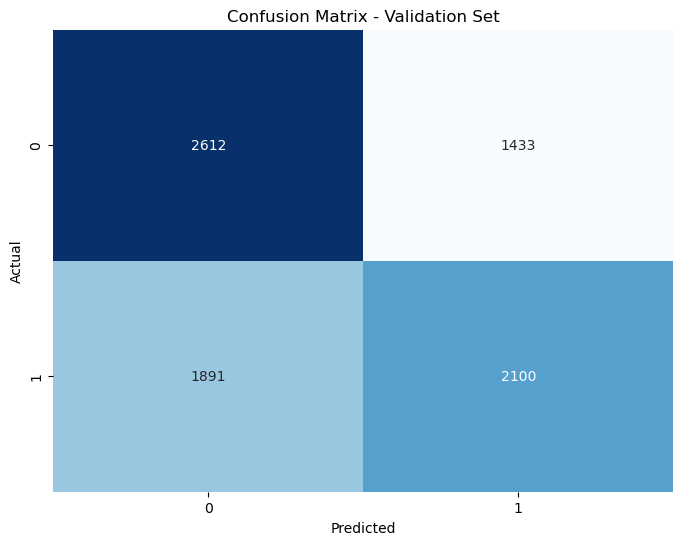

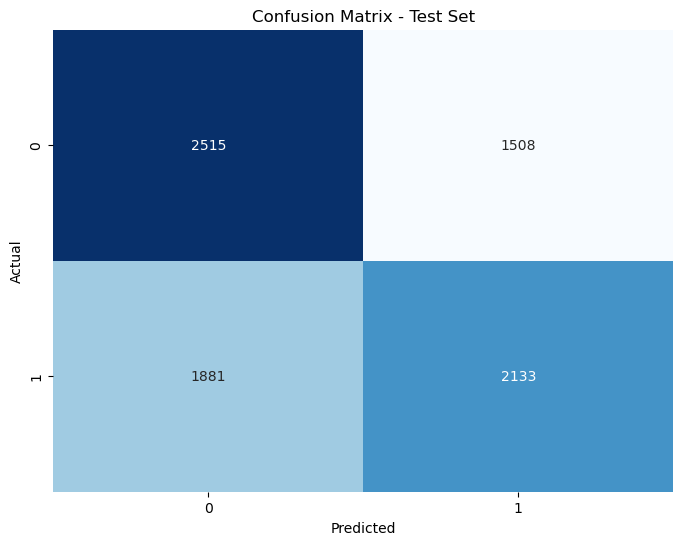

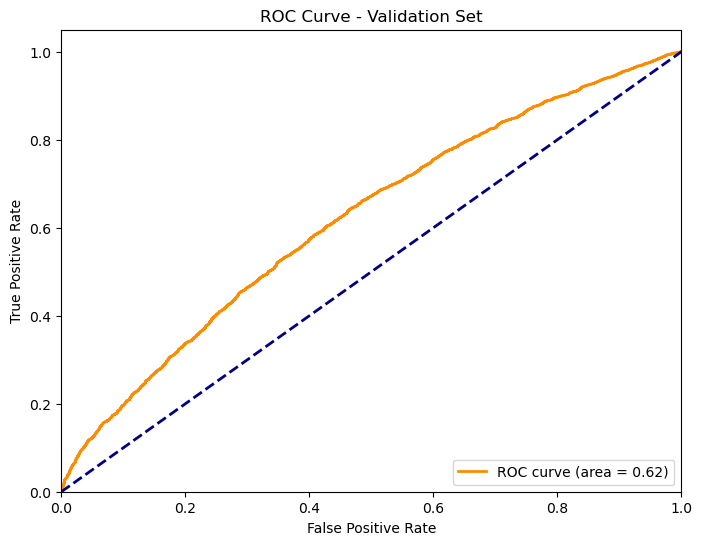

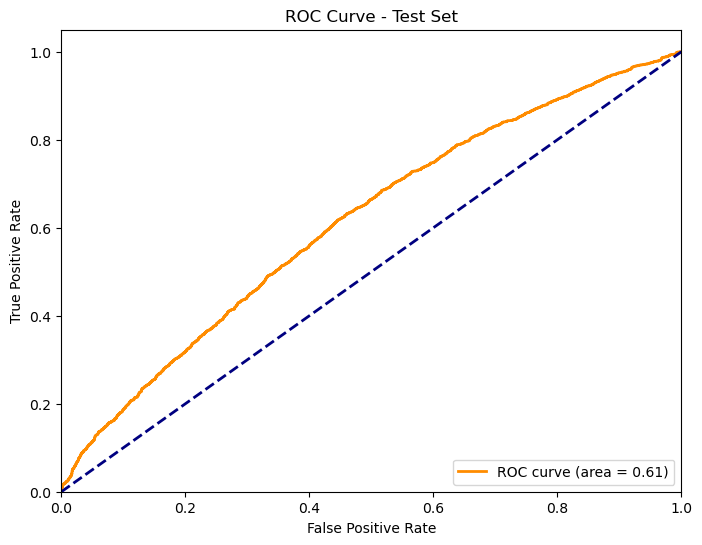

In [28]:
# Required Libraries
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import confusion_matrix, classification_report, roc_curve, auc
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split
from imblearn.over_sampling import SMOTE
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score



df_1_encoded = pd.get_dummies(df_1, drop_first=True)

# Dropping the 'success' from the features
X = df_1_encoded.drop('success', axis=1)
y = df_1_encoded['success']

# Standardize the data
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

# Apply SMOTE to handle imbalanced data
smote = SMOTE(random_state=42)
X_resampled, y_resampled = smote.fit_resample(X_scaled, y)

# Split data into training, validation, and test sets
X_train, X_temp, y_train, y_temp = train_test_split(X_resampled, y_resampled, test_size=0.2, random_state=42)
X_valid, X_test, y_valid, y_test = train_test_split(X_temp, y_temp, test_size=0.5, random_state=42)

# Initialize and train Logistic Regression model
log_reg = LogisticRegression(random_state=42)
log_reg.fit(X_train, y_train)

# Validation set predictions
y_valid_pred = log_reg.predict(X_valid)
y_valid_prob = log_reg.predict_proba(X_valid)[:, 1]  # For ROC curve

# Test set predictions
y_test_pred = log_reg.predict(X_test)
y_test_prob = log_reg.predict_proba(X_test)[:, 1]  # For ROC curve

# Calculate and print metrics for Validation Set
val_acc = accuracy_score(y_valid, y_valid_pred)
val_prec = precision_score(y_valid, y_valid_pred)
val_recall = recall_score(y_valid, y_valid_pred)
val_f1 = f1_score(y_valid, y_valid_pred)
val_cm = confusion_matrix(y_valid, y_valid_pred)

print(f"Validation Accuracy: {val_acc}")
print(f"Validation Precision: {val_prec}")
print(f"Validation Recall: {val_recall}")
print(f"Validation F1 Score: {val_f1}")

# Calculate and print metrics for Test Set
test_acc = accuracy_score(y_test, y_test_pred)
test_prec = precision_score(y_test, y_test_pred)
test_recall = recall_score(y_test, y_test_pred)
test_f1 = f1_score(y_test, y_test_pred)
test_cm = confusion_matrix(y_test, y_test_pred)

print(f"Test Accuracy: {test_acc}")
print(f"Test Precision: {test_prec}")
print(f"Test Recall: {test_recall}")
print(f"Test F1 Score: {test_f1}")

# Confusion Matrix Visualization
def plot_confusion_matrix(cm, title):
    plt.figure(figsize=(8, 6))
    sns.heatmap(cm, annot=True, fmt='g', cmap='Blues', cbar=False)
    plt.title(f'Confusion Matrix - {title}')
    plt.xlabel('Predicted')
    plt.ylabel('Actual')
    plt.show()

# ROC Curve and AUC Visualization
def plot_roc_curve(y_true, y_prob, title):
    fpr, tpr, _ = roc_curve(y_true, y_prob)
    roc_auc = auc(fpr, tpr)
    plt.figure(figsize=(8, 6))
    plt.plot(fpr, tpr, color='darkorange', lw=2, label=f'ROC curve (area = {roc_auc:.2f})')
    plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
    plt.xlim([0.0, 1.0])
    plt.ylim([0.0, 1.05])
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.title(f'ROC Curve - {title}')
    plt.legend(loc="lower right")
    plt.show()

# Plot Confusion Matrices
plot_confusion_matrix(val_cm, "Validation Set")
plot_confusion_matrix(test_cm, "Test Set")

# Plot ROC Curve and AUC
plot_roc_curve(y_valid, y_valid_prob, "Validation Set")
plot_roc_curve(y_test, y_test_prob, "Test Set")



In [29]:
# Encode categorical variables using one-hot encoding
df_1 = pd.get_dummies(df_1, columns=['country', 'PSP', 'card'])
# Print the DataFrame after one-hot encoding
print(df_1)

# Drop the target variable 'success' from the features
X = df_1.drop('success', axis=1)
# Initialize the StandardScaler
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)
df_1_scaled = pd.DataFrame(X_scaled, columns=X.columns)
df_1_scaled['success'] = df_1['success']
# Print the DataFrame with scaled features
print(df_1_scaled)
X_smote = df_1_scaled.drop('success', axis=1)
y_smote = df_1_scaled['success']
# Apply SMOTE
smote = SMOTE(random_state=42)
X_resampled, y_resampled = smote.fit_resample(X_smote, y_smote)
df_1_resampled = pd.DataFrame(X_resampled, columns=X_smote.columns)
df_1_resampled['success'] = y_resampled
# Display the updated DataFrame with SMOTE
print(df_1_resampled)
X_1 = df_1_resampled.drop('success', axis=1)
y_1 = df_1_resampled['success']
# Split the dataset into train, validation, and test sets
X_train_1, X_temp, y_train_1, y_temp = train_test_split(X_1, y_1, test_size=0.2, random_state=42)
X_valid_1, X_test_1, y_valid_1, y_test_1 = train_test_split(X_temp, y_temp, test_size=0.5, random_state=42)
scaler = StandardScaler()
X_train_scaled_1 = scaler.fit_transform(X_train_1)
X_valid_scaled_1 = scaler.transform(X_valid_1)
X_test_scaled_1 = scaler.transform(X_test_1)

       amount  success  3D_secured  day_of_week  minute_of_day  \
0           6        0           0            3            229   
1           6        0           0            3            229   
2           6        0           0            4            302   
3           6        0           0            4            302   
4           6        0           0            4            302   
...       ...      ...         ...          ...            ...   
50405     499        0           0            3            247   
50406     499        0           0            3            247   
50407     499        0           0            3            248   
50408     499        0           0            3            248   
50409     499        0           0            3            249   

       payment_attempts  country_Austria  country_Germany  \
0                     1                1                0   
1                     2                1                0   
2                     1 

Random Forest - Validation Accuracy: 0.807117969138875
Random Forest - Validation Precision: 0.8061198896413343
Random Forest - Validation Recall: 0.8053119518917564
Random Forest - Validation F1 Score: 0.805715718225119
Random Forest - Test Accuracy: 0.8101281572726141
Random Forest - Test Precision: 0.815096251266464
Random Forest - Test Recall: 0.8016940707523668
Random Forest - Test F1 Score: 0.808339613162522


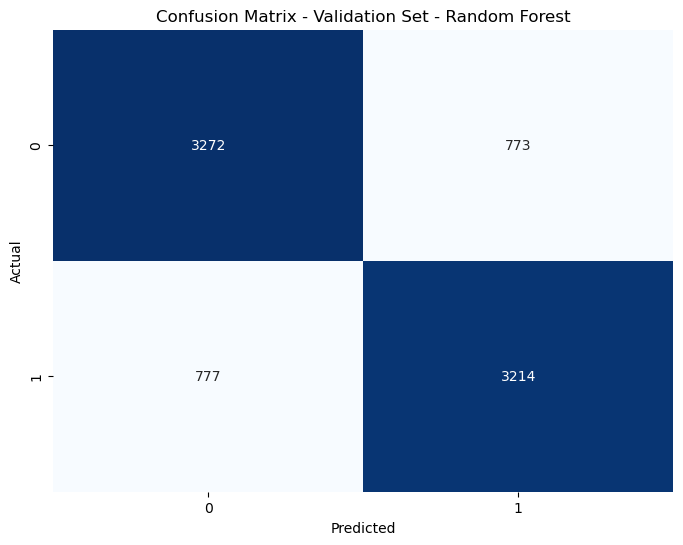

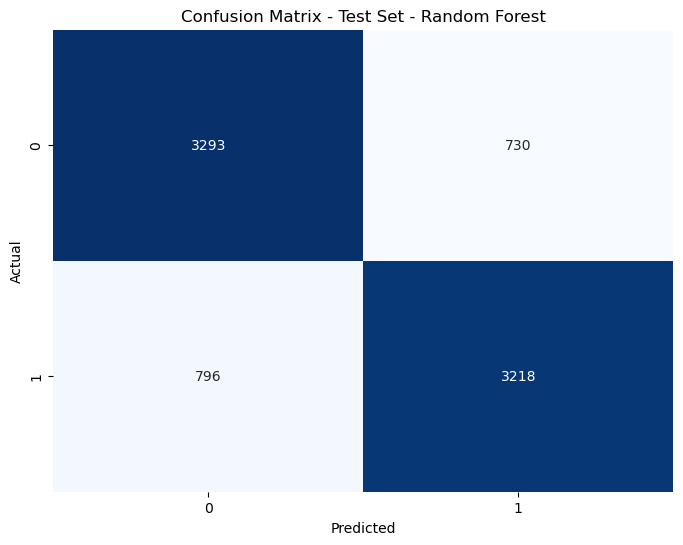

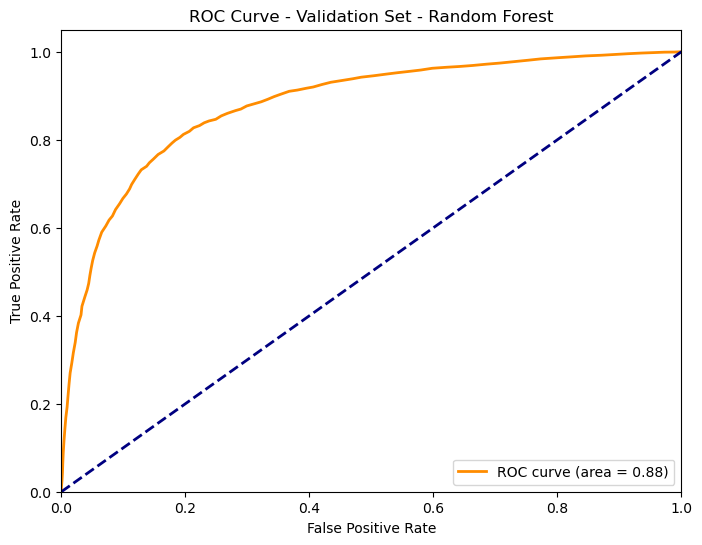

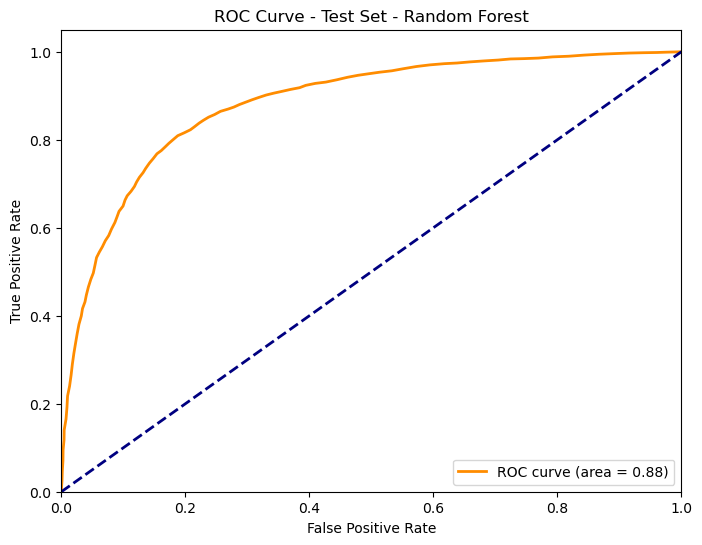

In [31]:
from sklearn.ensemble import RandomForestClassifier

# Initialize Random Forest Classifier
rf_clf = RandomForestClassifier(random_state=42, n_estimators=100)

# Train the model
rf_clf.fit(X_train, y_train)

# Validation set predictions
y_valid_pred_rf = rf_clf.predict(X_valid)
y_valid_prob_rf = rf_clf.predict_proba(X_valid)[:, 1]  # For ROC curve

# Test set predictions
y_test_pred_rf = rf_clf.predict(X_test)
y_test_prob_rf = rf_clf.predict_proba(X_test)[:, 1]  # For ROC curve

# Calculate and print metrics for Validation Set (Random Forest)
val_acc_rf = accuracy_score(y_valid, y_valid_pred_rf)
val_prec_rf = precision_score(y_valid, y_valid_pred_rf)
val_recall_rf = recall_score(y_valid, y_valid_pred_rf)
val_f1_rf = f1_score(y_valid, y_valid_pred_rf)
val_cm_rf = confusion_matrix(y_valid, y_valid_pred_rf)

print(f"Random Forest - Validation Accuracy: {val_acc_rf}")
print(f"Random Forest - Validation Precision: {val_prec_rf}")
print(f"Random Forest - Validation Recall: {val_recall_rf}")
print(f"Random Forest - Validation F1 Score: {val_f1_rf}")

# Calculate and print metrics for Test Set (Random Forest)
test_acc_rf = accuracy_score(y_test, y_test_pred_rf)
test_prec_rf = precision_score(y_test, y_test_pred_rf)
test_recall_rf = recall_score(y_test, y_test_pred_rf)
test_f1_rf = f1_score(y_test, y_test_pred_rf)
test_cm_rf = confusion_matrix(y_test, y_test_pred_rf)

print(f"Random Forest - Test Accuracy: {test_acc_rf}")
print(f"Random Forest - Test Precision: {test_prec_rf}")
print(f"Random Forest - Test Recall: {test_recall_rf}")
print(f"Random Forest - Test F1 Score: {test_f1_rf}")

# Plot Confusion Matrices for Random Forest
plot_confusion_matrix(val_cm_rf, "Validation Set - Random Forest")
plot_confusion_matrix(test_cm_rf, "Test Set - Random Forest")

# Plot ROC Curve and AUC for Random Forest
plot_roc_curve(y_valid, y_valid_prob_rf, "Validation Set - Random Forest")
plot_roc_curve(y_test, y_test_prob_rf, "Test Set - Random Forest")


Gradient Boosting - Validation Results:
Accuracy: 0.712045793927327
Precision: 0.7392296718972896
Recall: 0.6492107241292909
F1 Score: 0.6913020277481323
Confusion Matrix:
 [[3131  914]
 [1400 2591]]

Gradient Boosting - Test Results:
Accuracy: 0.712454896105512
Precision: 0.7375174337517434
Recall: 0.6586945690084703
F1 Score: 0.6958810369785499
Confusion Matrix:
 [[3082  941]
 [1370 2644]]


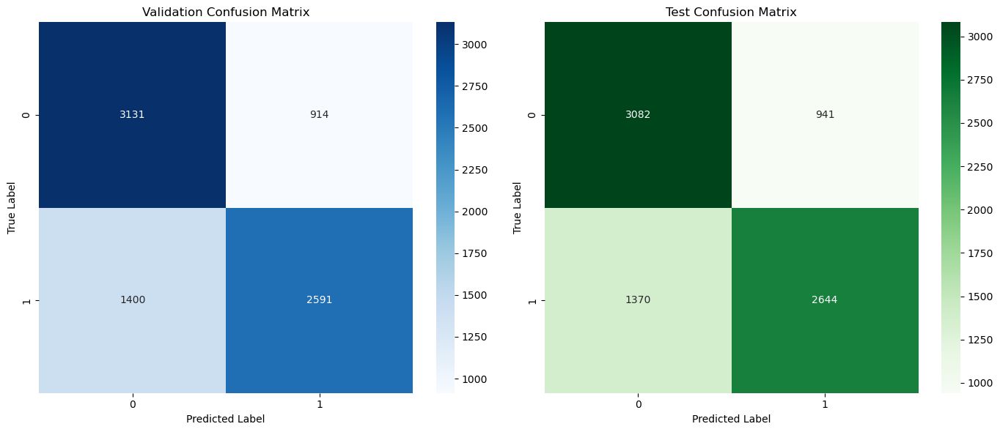

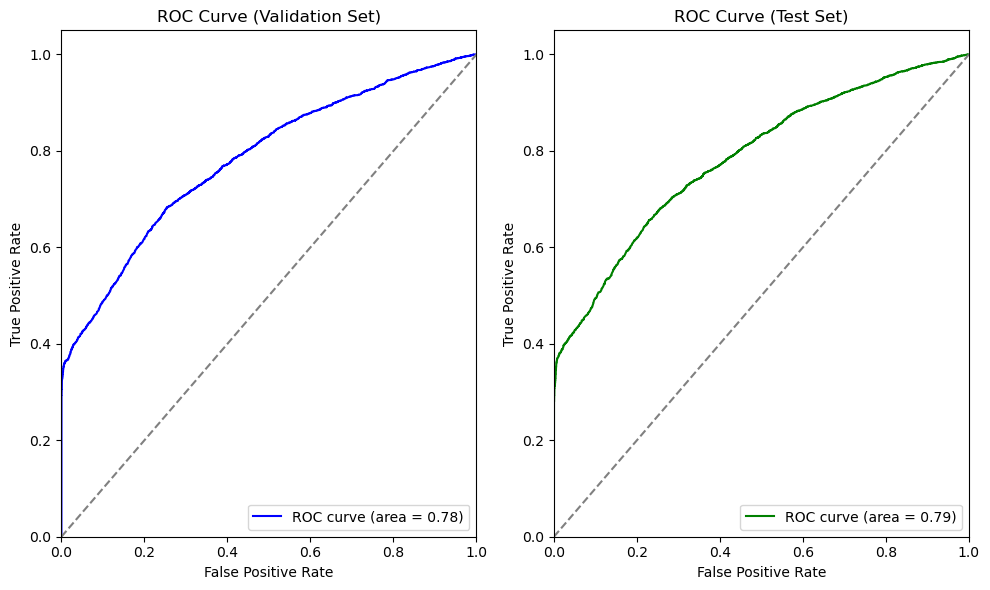

In [32]:
from sklearn.ensemble import GradientBoostingClassifier
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, confusion_matrix, roc_curve, auc
from sklearn.preprocessing import StandardScaler
import seaborn as sns
import matplotlib.pyplot as plt


# Standardize the data
scaler = StandardScaler()
X_train_scaled_1 = scaler.fit_transform(X_train_1)
X_valid_scaled_1 = scaler.transform(X_valid_1)
X_test_scaled_1 = scaler.transform(X_test_1)

gb_model = GradientBoostingClassifier(random_state=42)

# Train the model on the training set
gb_model.fit(X_train_scaled_1, y_train_1)

# Make predictions on the validation and test sets
y_valid_pred_gb = gb_model.predict(X_valid_scaled_1)
y_test_pred_gb = gb_model.predict(X_test_scaled_1)

# Get prediction probabilities for ROC-AUC curves
y_valid_prob_gb = gb_model.predict_proba(X_valid_scaled_1)[:, 1]
y_test_prob_gb = gb_model.predict_proba(X_test_scaled_1)[:, 1]

val_acc_gb = accuracy_score(y_valid_1, y_valid_pred_gb)
val_precision_gb = precision_score(y_valid_1, y_valid_pred_gb)
val_recall_gb = recall_score(y_valid_1, y_valid_pred_gb)
val_f1_gb = f1_score(y_valid_1, y_valid_pred_gb)

test_acc_gb = accuracy_score(y_test_1, y_test_pred_gb)
test_precision_gb = precision_score(y_test_1, y_test_pred_gb)
test_recall_gb = recall_score(y_test_1, y_test_pred_gb)
test_f1_gb = f1_score(y_test_1, y_test_pred_gb)

confusion_matrix_valid_gb = confusion_matrix(y_valid_1, y_valid_pred_gb)
confusion_matrix_test_gb = confusion_matrix(y_test_1, y_test_pred_gb)

# Output the results
print("Gradient Boosting - Validation Results:")
print(f"Accuracy: {val_acc_gb}")
print(f"Precision: {val_precision_gb}")
print(f"Recall: {val_recall_gb}")
print(f"F1 Score: {val_f1_gb}")
print(f"Confusion Matrix:\n {confusion_matrix_valid_gb}")

print("\nGradient Boosting - Test Results:")
print(f"Accuracy: {test_acc_gb}")
print(f"Precision: {test_precision_gb}")
print(f"Recall: {test_recall_gb}")
print(f"F1 Score: {test_f1_gb}")
print(f"Confusion Matrix:\n {confusion_matrix_test_gb}")

# Plot Confusion Matrix for Validation and Test Sets
plt.figure(figsize=(14, 6))

# Validation Confusion Matrix
plt.subplot(1, 2, 1)
sns.heatmap(confusion_matrix_valid_gb, annot=True, fmt='d', cmap='Blues')
plt.title('Validation Confusion Matrix')
plt.xlabel('Predicted Label')
plt.ylabel('True Label')

# Test Confusion Matrix
plt.subplot(1, 2, 2)
sns.heatmap(confusion_matrix_test_gb, annot=True, fmt='d', cmap='Greens')
plt.title('Test Confusion Matrix')
plt.xlabel('Predicted Label')
plt.ylabel('True Label')

plt.tight_layout()
plt.show()

# ROC Curve plotting
fpr_valid_gb, tpr_valid_gb, _ = roc_curve(y_valid_1, y_valid_prob_gb)
roc_auc_valid_gb = auc(fpr_valid_gb, tpr_valid_gb)

fpr_test_gb, tpr_test_gb, _ = roc_curve(y_test_1, y_test_prob_gb)
roc_auc_test_gb = auc(fpr_test_gb, tpr_test_gb)

# Plot ROC-AUC curve for validation and test sets
plt.figure(figsize=(10, 6))

# Validation ROC-AUC
plt.subplot(1, 2, 1)
plt.plot(fpr_valid_gb, tpr_valid_gb, color='blue', label=f'ROC curve (area = {roc_auc_valid_gb:.2f})')
plt.plot([0, 1], [0, 1], color='gray', linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curve (Validation Set)')
plt.legend(loc='lower right')

# Test ROC-AUC
plt.subplot(1, 2, 2)
plt.plot(fpr_test_gb, tpr_test_gb, color='green', label=f'ROC curve (area = {roc_auc_test_gb:.2f})')
plt.plot([0, 1], [0, 1], color='gray', linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curve (Test Set)')
plt.legend(loc='lower right')

plt.tight_layout()
plt.show()


Random Forest - Validation Accuracy: 0.7664
Random Forest - Validation Precision: 0.3109
Random Forest - Validation Recall: 0.1201
Random Forest - Validation F1 Score: 0.1732
Random Forest - Test Accuracy: 0.7633
Random Forest - Test Precision: 0.2966
Random Forest - Test Recall: 0.1070
Random Forest - Test F1 Score: 0.1573


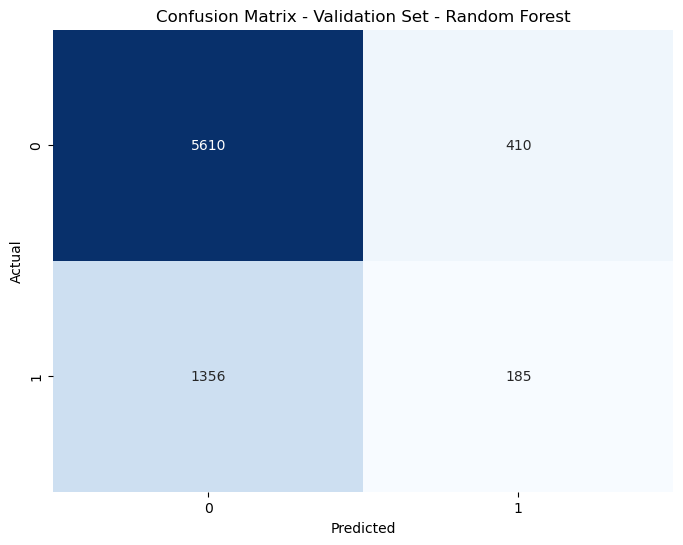

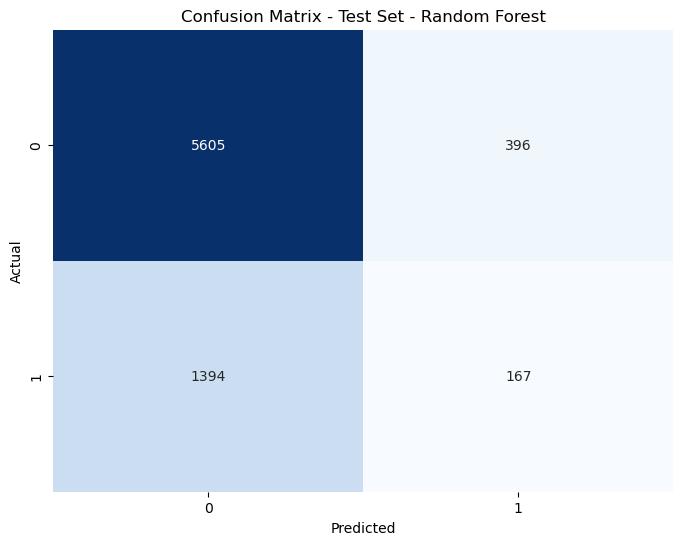

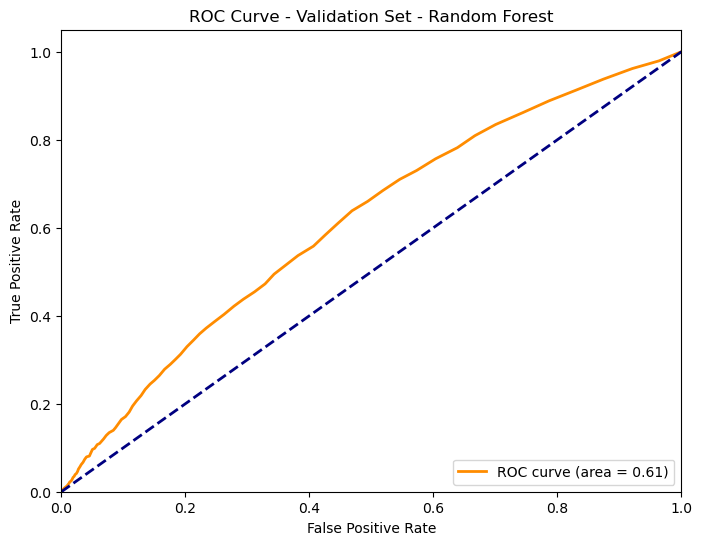

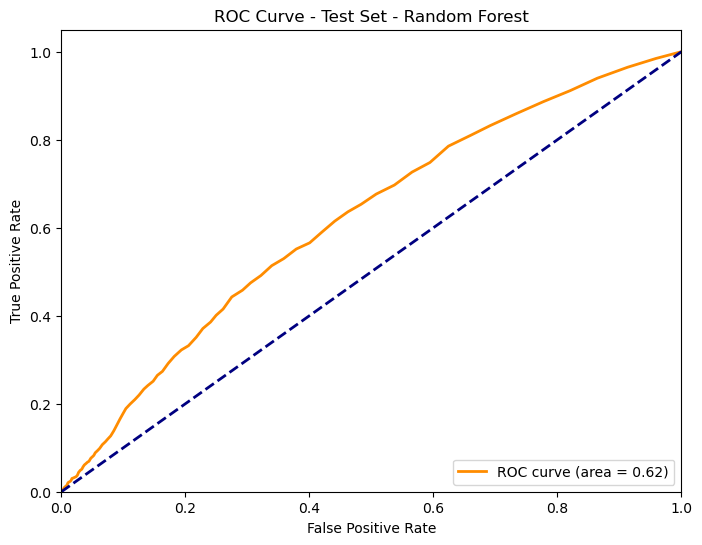

In [33]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, confusion_matrix
from sklearn.model_selection import train_test_split
import pandas as pd


# Splitting the data into training, validation, and test sets
X_train, X_temp, y_train, y_temp = train_test_split(X, y, test_size=0.3, random_state=42)  # 70% training
X_valid, X_test, y_valid, y_test = train_test_split(X_temp, y_temp, test_size=0.5, random_state=42)  # 15% validation, 15% test

# Initialize Random Forest Classifier with desired hyperparameters
rf_clf = RandomForestClassifier(random_state=42, n_estimators=100)

# Train the model
rf_clf.fit(X_train, y_train)

# Validation set predictions
y_valid_pred_rf = rf_clf.predict(X_valid)
y_valid_prob_rf = rf_clf.predict_proba(X_valid)[:, 1]  # For ROC curve

# Test set predictions
y_test_pred_rf = rf_clf.predict(X_test)
y_test_prob_rf = rf_clf.predict_proba(X_test)[:, 1]  # For ROC curve

# Calculate and print metrics for Validation Set (Random Forest)
val_acc_rf = accuracy_score(y_valid, y_valid_pred_rf)
val_prec_rf = precision_score(y_valid, y_valid_pred_rf)
val_recall_rf = recall_score(y_valid, y_valid_pred_rf)
val_f1_rf = f1_score(y_valid, y_valid_pred_rf)
val_cm_rf = confusion_matrix(y_valid, y_valid_pred_rf)

print(f"Random Forest - Validation Accuracy: {val_acc_rf:.4f}")
print(f"Random Forest - Validation Precision: {val_prec_rf:.4f}")
print(f"Random Forest - Validation Recall: {val_recall_rf:.4f}")
print(f"Random Forest - Validation F1 Score: {val_f1_rf:.4f}")

# Calculate and print metrics for Test Set (Random Forest)
test_acc_rf = accuracy_score(y_test, y_test_pred_rf)
test_prec_rf = precision_score(y_test, y_test_pred_rf)
test_recall_rf = recall_score(y_test, y_test_pred_rf)
test_f1_rf = f1_score(y_test, y_test_pred_rf)
test_cm_rf = confusion_matrix(y_test, y_test_pred_rf)

print(f"Random Forest - Test Accuracy: {test_acc_rf:.4f}")
print(f"Random Forest - Test Precision: {test_prec_rf:.4f}")
print(f"Random Forest - Test Recall: {test_recall_rf:.4f}")
print(f"Random Forest - Test F1 Score: {test_f1_rf:.4f}")

# Plot Confusion Matrices for Random Forest
plot_confusion_matrix(val_cm_rf, "Validation Set - Random Forest")
plot_confusion_matrix(test_cm_rf, "Test Set - Random Forest")

# Plot ROC Curve and AUC for Random Forest
plot_roc_curve(y_valid, y_valid_prob_rf, "Validation Set - Random Forest")
plot_roc_curve(y_test, y_test_prob_rf, "Test Set - Random Forest")

# Make success probability predictions
success_probabilities = rf_clf.predict_proba(X)[:, 1]  # Predict probabilities for all dat


In [34]:
df_1 = df.copy()
df_1 = df_1.drop('transaction_fee', axis=1)
print(df_1)
df_encoded_1 = pd.get_dummies(df_1, columns=['country', 'card'])

           country  amount  success         PSP  3D_secured    card  \
0          Austria       6        0   Moneycard           0  Diners   
1          Austria       6        0  Simplecard           0  Diners   
2          Austria       6        0     UK_Card           0  Diners   
3          Austria       6        0     UK_Card           0  Diners   
4          Austria       6        0  Simplecard           0  Diners   
...            ...     ...      ...         ...         ...     ...   
50405  Switzerland     499        0     UK_Card           0  Master   
50406  Switzerland     499        0     UK_Card           0  Master   
50407  Switzerland     499        0     UK_Card           0  Master   
50408  Switzerland     499        0     UK_Card           0  Master   
50409  Switzerland     499        0     UK_Card           0  Master   

       day_of_week  minute_of_day  payment_attempts  
0                3            229                 1  
1                3            229      

In [35]:
def evaluate_model(model, X_scaled, y, set_name):
    """
    Evaluating the performance of a model on a given dataset.
    
    Parameters:
    model (object): A trained model instance.
    X_scaled (array): Scaled features of the dataset.
    y (array): Target variable of the dataset.
    set_name (str): The name of the dataset (e.g., 'Training', 'Validation', 'Testing').
    
    Returns:
    None
    """
    # Making predictions using the model
    y_pred = model.predict(X_scaled)

    # Getting the predicted probabilities for the positive class
    y_pred_proba = model.predict_proba(X_scaled)[:, 1]

    # Calculating evaluation metrics
    accuracy = accuracy_score(y, y_pred)
    precision = precision_score(y, y_pred)
    recall = recall_score(y, y_pred)
    f1 = f1_score(y, y_pred)
    roc_auc = roc_auc_score(y, y_pred)

    # Generating and printing the classification report
    print(f"\n{'='*15} {type(model).__name__} Performance on {set_name} Set {'='*15}\n")
    print(f"Accuracy: {accuracy:.4f}")
    print(f"Precision: {precision:.4f}")
    print(f"Recall: {recall:.4f}")
    print(f"F1-Score: {f1:.4f}")
    print(f"AUC-ROC: {roc_auc:.4f}")
    print("\n" + classification_report(y, y_pred))

    # Creating and displaying the confusion matrix
    conf_matrix = confusion_matrix(y, y_pred)
    cm_df = pd.DataFrame(conf_matrix, index=model.classes_, columns=model.classes_)
    plt.figure(figsize=(6, 5))
    sns.heatmap(cm_df, annot=True, cmap='Blues', fmt='g', cbar=False)
    plt.title(f'Confusion Matrix - {set_name} Set ({type(model).__name__})')
    plt.xlabel('Predicted Label')
    plt.ylabel('True Label')
    plt.tight_layout()
    plt.show()

    # Plotting the ROC curve
    fpr, tpr, _ = roc_curve(y, y_pred)
    plt.figure(figsize=(7, 5))
    plt.plot([0, 1], [0, 1], linestyle='--', color='gray')
    plt.plot(fpr, tpr, color='blue', label=f'AUC = {roc_auc:.4f}')
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.title(f'ROC Curve - {set_name} Set ({type(model).__name__})')
    plt.legend(loc='lower right')
    plt.grid(True)
    plt.tight_layout()
    plt.show()


Encoding categorical variables using one-hot encoding...
Splitting the dataset into features and target...
Splitting the dataset into training, validation, and test sets...
Training the baseline KNN model...
Evaluating the model on the validation set...

=============== KNeighborsClassifier Performance on Validation Set ===============

Accuracy: 0.7705
Precision: 0.2475
Recall: 0.0736
F1-Score: 0.1134
AUC-ROC: 0.5089

              precision    recall  f1-score   support

           0       0.80      0.94      0.87      4035
           1       0.25      0.07      0.11      1006

    accuracy                           0.77      5041
   macro avg       0.53      0.51      0.49      5041
weighted avg       0.69      0.77      0.72      5041



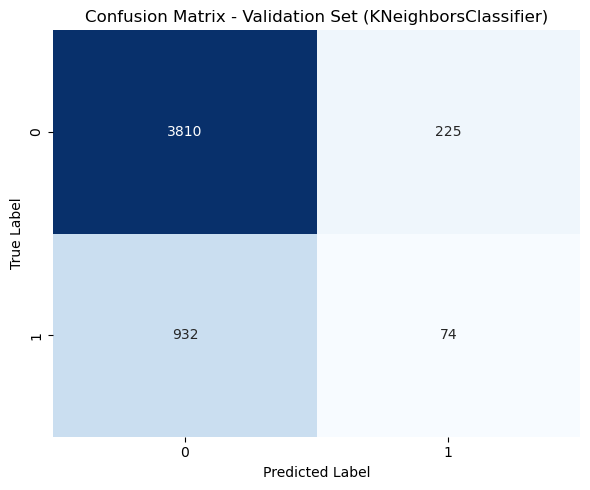

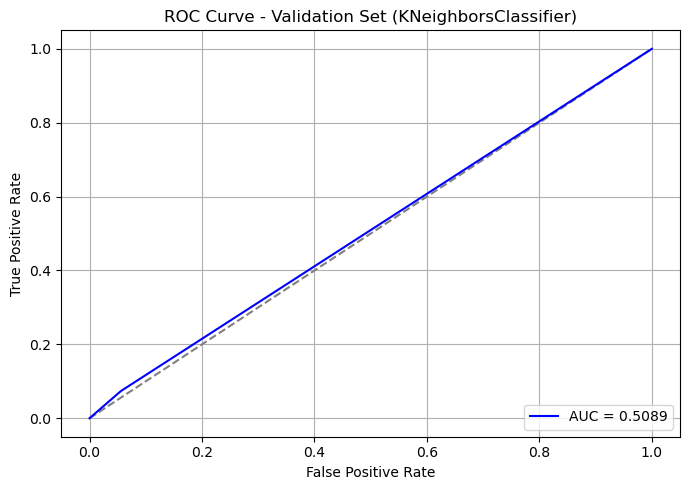

Evaluating the model on the test set...

=============== KNeighborsClassifier Performance on Test Set ===============

Accuracy: 0.7592
Precision: 0.2124
Recall: 0.0516
F1-Score: 0.0831
AUC-ROC: 0.5002

              precision    recall  f1-score   support

           0       0.79      0.95      0.86      3976
           1       0.21      0.05      0.08      1065

    accuracy                           0.76      5041
   macro avg       0.50      0.50      0.47      5041
weighted avg       0.67      0.76      0.70      5041



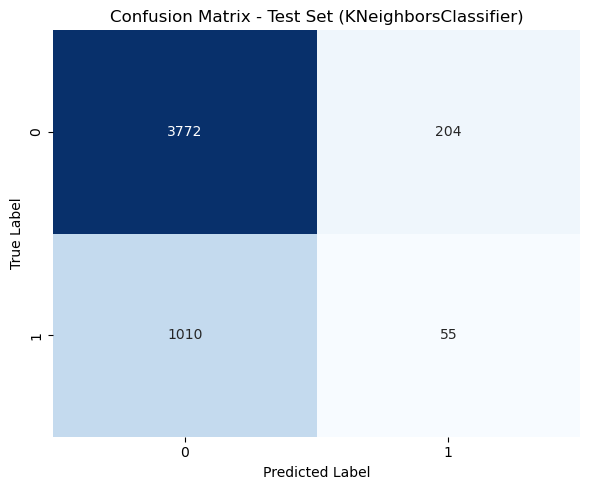

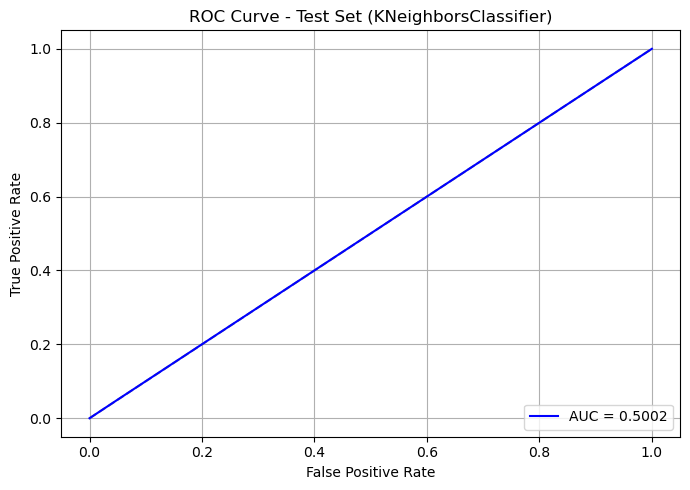

In [36]:
# One-hot encoding categorical variables
print("Encoding categorical variables using one-hot encoding...")
df_1_encoded = pd.get_dummies(df_1, columns=['country', 'PSP', 'card'])

# Splitting the dataset into features (X) and target (y)
print("Splitting the dataset into features and target...")
X_original = df_1_encoded.drop('success', axis=1)
y_original = df_1_encoded['success']

# Dividing the dataset into training, validation, and test sets
print("Splitting the dataset into training, validation, and test sets...")
X_train_original, X_temp_original, y_train_original, y_temp_original = train_test_split(
    X_original, y_original, test_size=0.2, random_state=42
)
X_validation_original, X_test_original, y_validation_original, y_test_original = train_test_split(
    X_temp_original, y_temp_original, test_size=0.5, random_state=42
)

# Creating and training a baseline KNN model
print("Training the baseline KNN model...")
baseline_knn_model = KNeighborsClassifier()
baseline_knn_model.fit(X_train_original, y_train_original)

# Evaluating the model on the validation set
print("Evaluating the model on the validation set...")
evaluate_model(baseline_knn_model, X_validation_original, y_validation_original, "Validation")

# Evaluating the model on the test set
print("Evaluating the model on the test set...")
evaluate_model(baseline_knn_model, X_test_original, y_test_original, "Test")


In [37]:
df_1 = pd.get_dummies(df_1, columns=['country', 'PSP', 'card'])

print(df_1)


X = df_1.drop('success', axis=1)
# Initialize the StandardScaler
scaler = StandardScaler()

X_scaled = scaler.fit_transform(X)
df_1_scaled = pd.DataFrame(X_scaled, columns=X.columns)
df_1_scaled['success'] = df_1['success']
# Print the DataFrame with scaled features
print(df_1_scaled)
X_smote = df_1_scaled.drop('success', axis=1)
y_smote = df_1_scaled['success']
# Apply SMOTE
smote = SMOTE(random_state=42)
X_resampled, y_resampled = smote.fit_resample(X_smote, y_smote)
# Create a new DataFrame with the resampled features and the target variable
df_1_resampled = pd.DataFrame(X_resampled, columns=X_smote.columns)
df_1_resampled['success'] = y_resampled
# Display the updated DataFrame with SMOTE
print(df_1_resampled)
# Development of Model A
X_1 = df_1_resampled.drop('success', axis=1)
y_1 = df_1_resampled['success']
# Split the dataset into train, validation, and test sets
X_train_1, X_temp, y_train_1, y_temp = train_test_split(X_1, y_1, test_size=0.2, random_state=42)
X_valid_1, X_test_1, y_valid_1, y_test_1 = train_test_split(X_temp, y_temp, test_size=0.5, random_state=42)
scaler = StandardScaler()
X_train_scaled_1 = scaler.fit_transform(X_train_1)
X_valid_scaled_1 = scaler.transform(X_valid_1)
X_test_scaled_1 = scaler.transform(X_test_1)

       amount  success  3D_secured  day_of_week  minute_of_day  \
0           6        0           0            3            229   
1           6        0           0            3            229   
2           6        0           0            4            302   
3           6        0           0            4            302   
4           6        0           0            4            302   
...       ...      ...         ...          ...            ...   
50405     499        0           0            3            247   
50406     499        0           0            3            247   
50407     499        0           0            3            248   
50408     499        0           0            3            248   
50409     499        0           0            3            249   

       payment_attempts  country_Austria  country_Germany  \
0                     1                1                0   
1                     2                1                0   
2                     1 

In [38]:
def calculate_classification_metrics(y_true, y_pred, y_pred_proba):
    """
    Calculating various classification metrics and displaying results.

    Parameters:
    y_true (array): True labels of the dataset.
    y_pred (array): Predicted labels by the model.
    y_pred_proba (array): Predicted probabilities for the positive class.

    Returns:
    dict: Dictionary containing calculated metrics.
    """
    
    # Calculating precision, recall, F1-score, AUC-ROC, and accuracy
    precision = precision_score(y_true, y_pred)
    recall = recall_score(y_true, y_pred)
    f1 = f1_score(y_true, y_pred)
    roc_auc = roc_auc_score(y_true, y_pred_proba)
    accuracy = accuracy_score(y_true, y_pred)

    # Storing the metrics in a dictionary
    metrics = {
        'Accuracy': accuracy,
        'Precision': precision,
        'Recall': recall,
        'F1-Score': f1,
        'AUC-ROC': roc_auc
    }

    # Displaying the classification metrics
    print("\nClassification Metrics:")
    for metric, value in metrics.items():
        print(f"{metric}: {value:.4f}")

    return metrics


In [38]:
def evaluate_model(model, X_scaled, y, set_name):
    """
    Evaluating the performance of a trained model on a specific dataset.

    Parameters:
    model (object): A trained model object.
    X_scaled (array): Scaled feature set for evaluation.
    y (array): True labels of the dataset.
    set_name (str): Name of the dataset (e.g., 'Training', 'Validation', 'Testing').

    Returns:
    None
    """

    print(f'\n{"="*20} {type(model).__name__} Evaluation on {set_name} Set {"="*20}\n')

    # Predicting labels and probabilities
    y_pred = model.predict(X_scaled)
    y_pred_proba = model.predict_proba(X_scaled)[:, 1]

    # Calculating classification metrics
    calculate_classification_metrics(y, y_pred, y_pred_proba)

    # Displaying confusion matrix
    conf_matrix = confusion_matrix(y, y_pred)
    cm_df = pd.DataFrame(conf_matrix, index=model.classes_, columns=model.classes_)
    
    print(f"\nConfusion Matrix - {set_name} Set:")
    print(cm_df)

    # Visualizing the confusion matrix
    plt.figure(figsize=(6, 4))
    plt.imshow(cm_df, cmap='Blues', interpolation='nearest')
    plt.title(f'Confusion Matrix - {set_name} Set')
    plt.colorbar()
    plt.xlabel('Predicted Label')
    plt.ylabel('True Label')
    plt.tight_layout()
    plt.show()

    # Plotting ROC curve
    fpr, tpr, _ = roc_curve(y, y_pred_proba)
    plt.figure(figsize=(7, 5))
    plt.plot([0, 1], [0, 1], 'k--', label="Baseline")
    plt.plot(fpr, tpr, label=f'AUC = {roc_auc_score(y, y_pred_proba):.4f}', color='darkorange')
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.title(f'ROC Curve - {set_name} Set')
    plt.legend(loc="lower right")
    plt.tight_layout()
    plt.show()


In [39]:
def train_and_evaluate_model(model, X_train_scaled, y_train, X_valid_scaled, y_valid, X_test_scaled, y_test):
    """
    Training the model and evaluating it on validation and test sets.

    Parameters:
    model (object): The machine learning model to train and evaluate.
    X_train_scaled (array): Scaled training feature set.
    y_train (array): Training labels.
    X_valid_scaled (array): Scaled validation feature set.
    y_valid (array): Validation labels.
    X_test_scaled (array): Scaled test feature set.
    y_test (array): Test labels.

    Returns:
    None
    """

    # Training the model with the training dataset
    print(f'\nTraining the {type(model).__name__} model...\n')
    model.fit(X_train_scaled, y_train)

    print(f'\n{"="*20} {type(model).__name__} Training Complete {"="*20}\n')

    # Evaluating the model on the validation set
    print("\nValidation Set Evaluation:")
    evaluate_model(model, X_valid_scaled, y_valid, "Validation")

    # Evaluating the model on the test set
    print("\nTest Set Evaluation:")
    evaluate_model(model, X_test_scaled, y_test, "Test")



Training the DecisionTreeClassifier model...


==================== DecisionTreeClassifier Training Complete ====================


Validation Set Evaluation:

=============== DecisionTreeClassifier Performance on Validation Set ===============

Accuracy: 0.7522
Precision: 0.7510
Recall: 0.7497
F1-Score: 0.7503
AUC-ROC: 0.7522

              precision    recall  f1-score   support

           0       0.75      0.75      0.75      4045
           1       0.75      0.75      0.75      3991

    accuracy                           0.75      8036
   macro avg       0.75      0.75      0.75      8036
weighted avg       0.75      0.75      0.75      8036



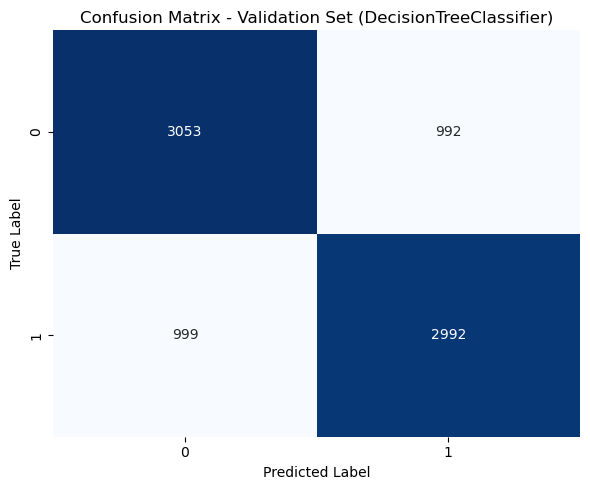

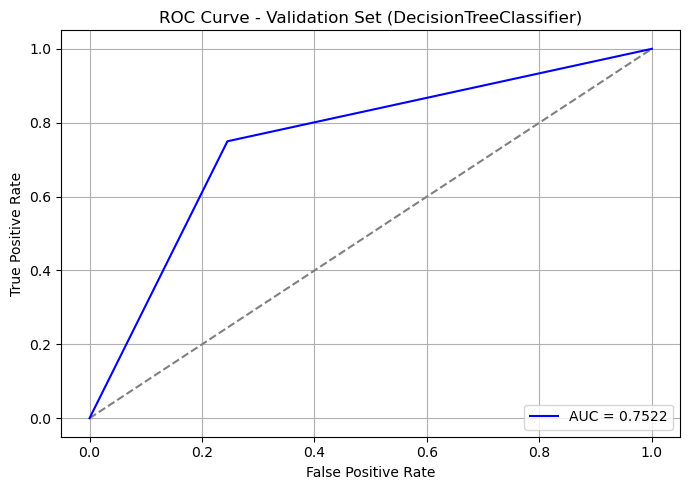


Test Set Evaluation:

=============== DecisionTreeClassifier Performance on Test Set ===============

Accuracy: 0.7508
Precision: 0.7522
Recall: 0.7471
F1-Score: 0.7497
AUC-ROC: 0.7508

              precision    recall  f1-score   support

           0       0.75      0.75      0.75      4023
           1       0.75      0.75      0.75      4014

    accuracy                           0.75      8037
   macro avg       0.75      0.75      0.75      8037
weighted avg       0.75      0.75      0.75      8037



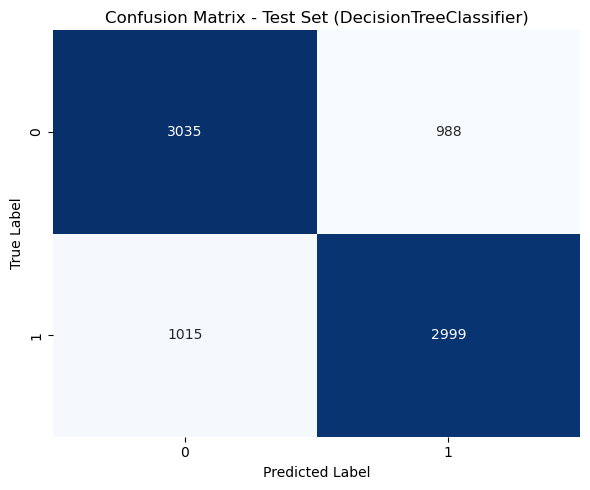

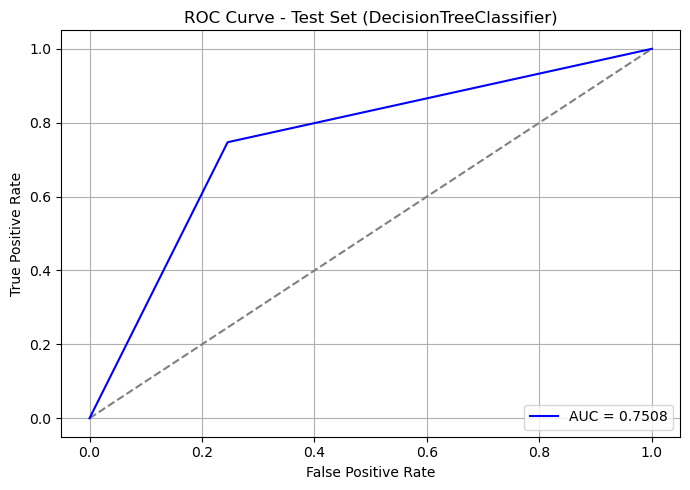

In [40]:
dt_model = DecisionTreeClassifier(random_state=42)
train_and_evaluate_model(dt_model, X_train_scaled_1, y_train_1, X_valid_scaled_1, y_valid_1, X_test_scaled_1, y_test_1)


Training the RandomForestClassifier model...


==================== RandomForestClassifier Training Complete ====================


Validation Set Evaluation:

=============== RandomForestClassifier Performance on Validation Set ===============

Accuracy: 0.8053
Precision: 0.8034
Recall: 0.8048
F1-Score: 0.8041
AUC-ROC: 0.8052

              precision    recall  f1-score   support

           0       0.81      0.81      0.81      4045
           1       0.80      0.80      0.80      3991

    accuracy                           0.81      8036
   macro avg       0.81      0.81      0.81      8036
weighted avg       0.81      0.81      0.81      8036



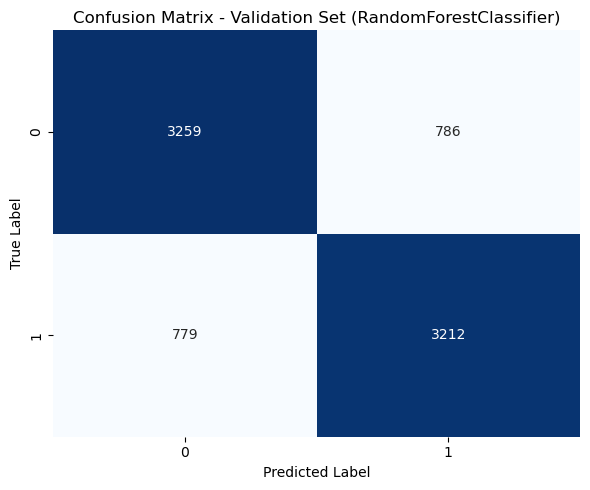

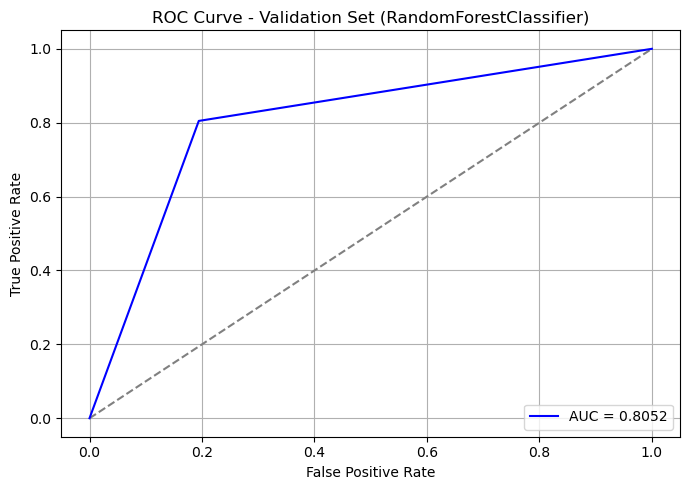


Test Set Evaluation:

=============== RandomForestClassifier Performance on Test Set ===============

Accuracy: 0.8034
Precision: 0.8083
Recall: 0.7950
F1-Score: 0.8016
AUC-ROC: 0.8034

              precision    recall  f1-score   support

           0       0.80      0.81      0.81      4023
           1       0.81      0.79      0.80      4014

    accuracy                           0.80      8037
   macro avg       0.80      0.80      0.80      8037
weighted avg       0.80      0.80      0.80      8037



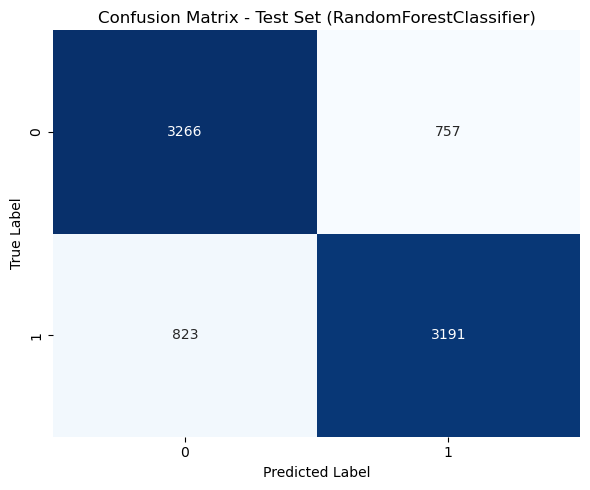

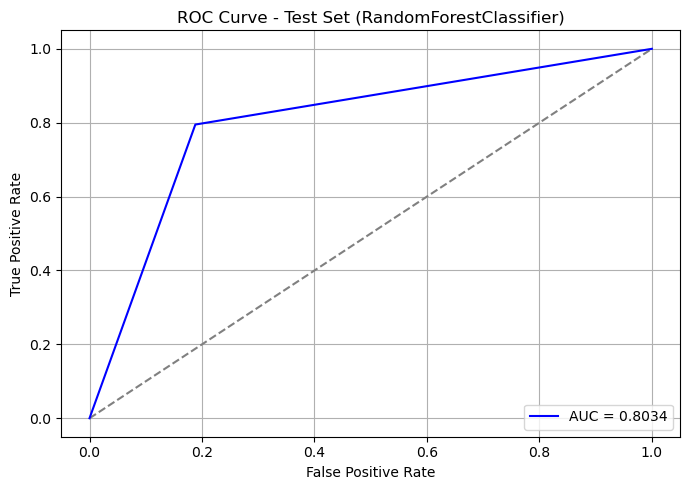

In [41]:
rf_model = RandomForestClassifier(random_state=42)
train_and_evaluate_model(rf_model, X_train_scaled_1, y_train_1, X_valid_scaled_1, y_valid_1, X_test_scaled_1, y_test_1)


Training the XGBClassifier model...


==================== XGBClassifier Training Complete ====================


Validation Set Evaluation:

=============== XGBClassifier Performance on Validation Set ===============

Accuracy: 0.7331
Precision: 0.7558
Recall: 0.6833
F1-Score: 0.7177
AUC-ROC: 0.7327

              precision    recall  f1-score   support

           0       0.71      0.78      0.75      4045
           1       0.76      0.68      0.72      3991

    accuracy                           0.73      8036
   macro avg       0.74      0.73      0.73      8036
weighted avg       0.74      0.73      0.73      8036



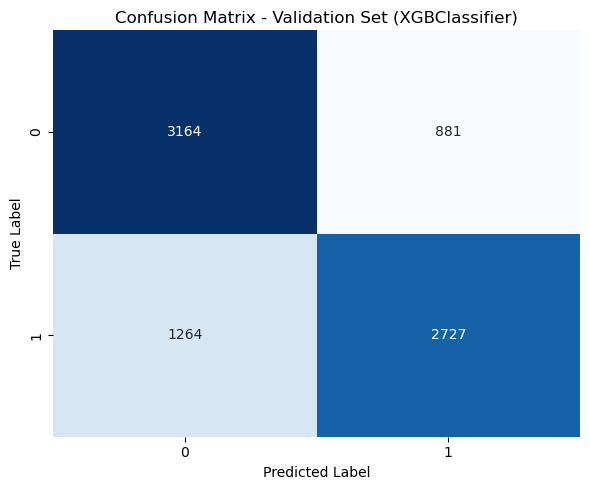

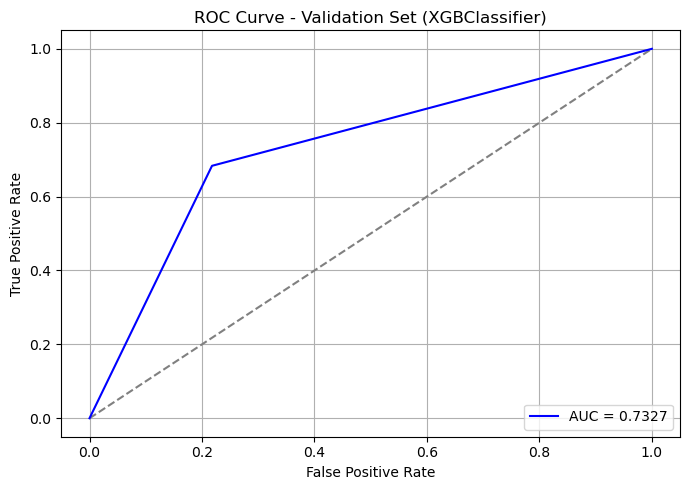


Test Set Evaluation:

=============== XGBClassifier Performance on Test Set ===============

Accuracy: 0.7365
Precision: 0.7616
Recall: 0.6876
F1-Score: 0.7227
AUC-ROC: 0.7364

              precision    recall  f1-score   support

           0       0.72      0.79      0.75      4023
           1       0.76      0.69      0.72      4014

    accuracy                           0.74      8037
   macro avg       0.74      0.74      0.74      8037
weighted avg       0.74      0.74      0.74      8037



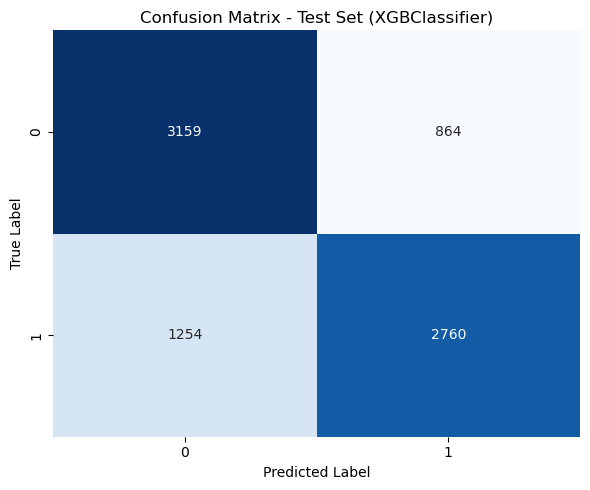

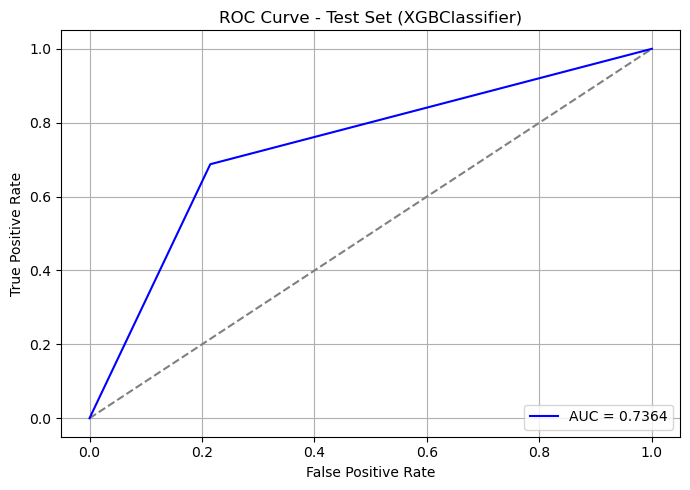

In [42]:

from xgboost import XGBClassifier  
import xgboost as xgb

xgb_model = xgb.XGBClassifier(random_state=42, objective='multi:softmax', num_class=9)
train_and_evaluate_model(xgb_model, X_train_scaled_1, y_train_1, X_valid_scaled_1, y_valid_1, X_test_scaled_1, y_test_1)

In [45]:
from sklearn.model_selection import GridSearchCV

def optimize_and_evaluate_model(model, param_grid, X_train, y_train, X_valid, y_valid, X_test, y_test, set_name):
    """
    Perform hyperparameter optimization using GridSearchCV and evaluate the model.

    Parameters:
    model (object): The machine learning model to optimize.
    param_grid (dict): The hyperparameters to optimize.
    X_train (array): Training feature set.
    y_train (array): Training labels.
    X_valid (array): Validation feature set.
    y_valid (array): Validation labels.
    X_test (array): Test feature set.
    y_test (array): Test labels.
    set_name (str): Name of the dataset/model being evaluated (e.g., 'Random Forest').

    Returns:
    best_model (object): The best performing model after GridSearchCV.
    """
    # Initialize GridSearchCV with cross-validation and accuracy scoring
    grid_search = GridSearchCV(estimator=model, param_grid=param_grid, scoring='accuracy', cv=5, n_jobs=-1)

    # Fit GridSearchCV to the training data
    print(f"\nOptimizing {type(model).__name__} with GridSearchCV for {set_name} set...")
    grid_search.fit(X_train, y_train)

    # Print the best hyperparameters and score from GridSearchCV
    print(f'\nBest Parameters found for {set_name} set - {type(model).__name__}:')
    print(f'{"="*20}{"="*20}')
    print(f"Best Parameters: {grid_search.best_params_}")
    print(f"Best CV Score: {grid_search.best_score_:.4f}")

    # Retrieve the best estimator
    best_model = grid_search.best_estimator_

    # Evaluate the best model on the validation and test sets
    print(f'\nEvaluating Best {set_name} Model:')
    train_and_evaluate_model(best_model, X_train, y_train, X_valid, y_valid, X_test, y_test)

    return best_model



Starting Random Forest Model Optimization...


Optimizing RandomForestClassifier with GridSearchCV for Random Forest set...

Best Parameters found for Random Forest set - RandomForestClassifier:
Best Parameters: {'max_depth': 30, 'min_samples_leaf': 1, 'min_samples_split': 2, 'n_estimators': 200}
Best CV Score: 0.7890

Evaluating Best Random Forest Model:

Training the RandomForestClassifier model...


==================== RandomForestClassifier Training Complete ====================


Validation Set Evaluation:

==================== RandomForestClassifier Evaluation on Validation Set ====================


Classification Metrics:
Accuracy: 0.8049
Precision: 0.8002
Recall: 0.8091
F1-Score: 0.8046
AUC-ROC: 0.8792

Confusion Matrix - Validation Set:
      0     1
0  3239   806
1   762  3229


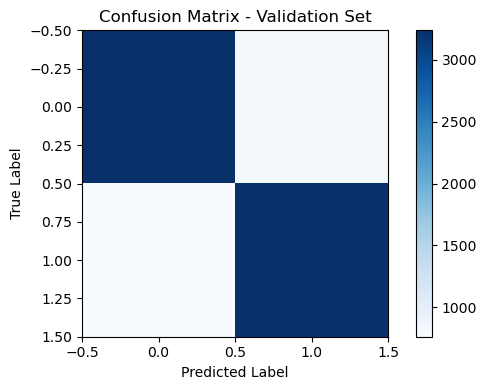

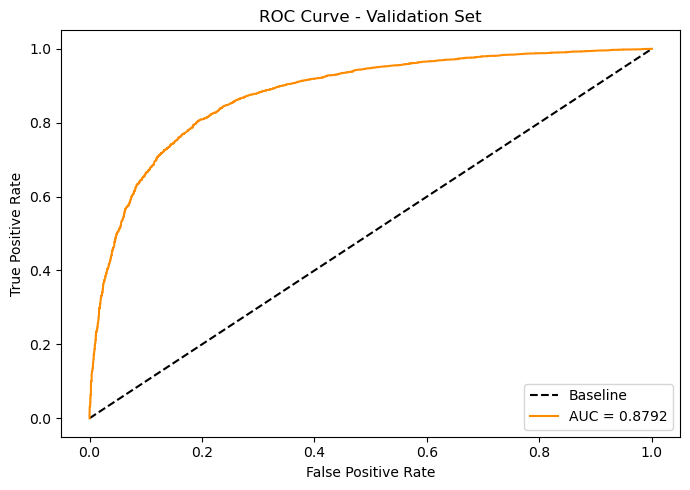


Test Set Evaluation:

==================== RandomForestClassifier Evaluation on Test Set ====================


Classification Metrics:
Accuracy: 0.8048
Precision: 0.8059
Recall: 0.8024
F1-Score: 0.8041
AUC-ROC: 0.8801

Confusion Matrix - Test Set:
      0     1
0  3247   776
1   793  3221


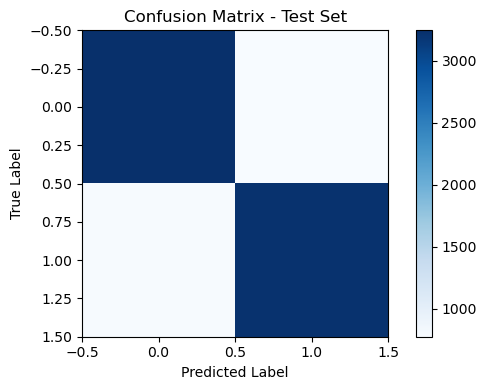

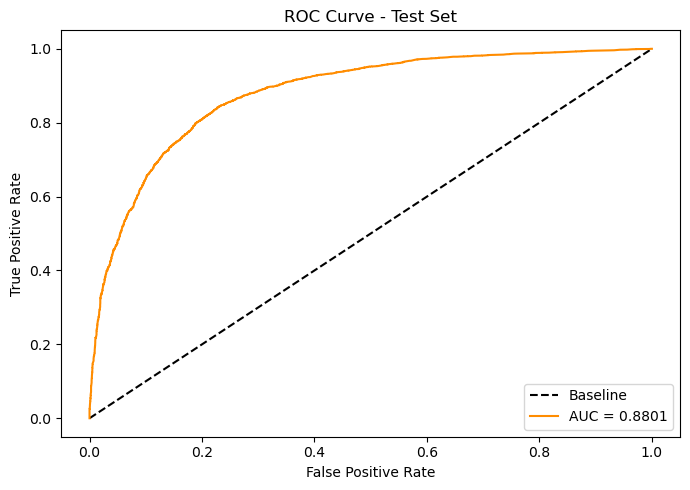


Final Evaluation of the Optimized Random Forest Model:

Training the RandomForestClassifier model...


==================== RandomForestClassifier Training Complete ====================


Validation Set Evaluation:

==================== RandomForestClassifier Evaluation on Validation Set ====================


Classification Metrics:
Accuracy: 0.8049
Precision: 0.8002
Recall: 0.8091
F1-Score: 0.8046
AUC-ROC: 0.8792

Confusion Matrix - Validation Set:
      0     1
0  3239   806
1   762  3229


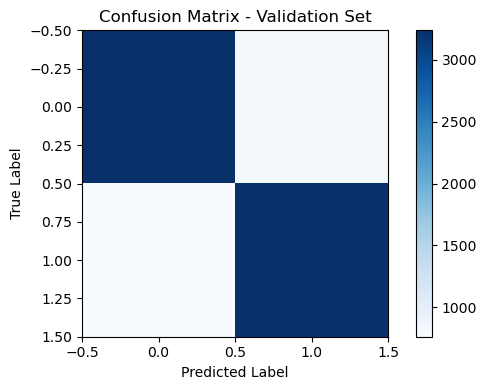

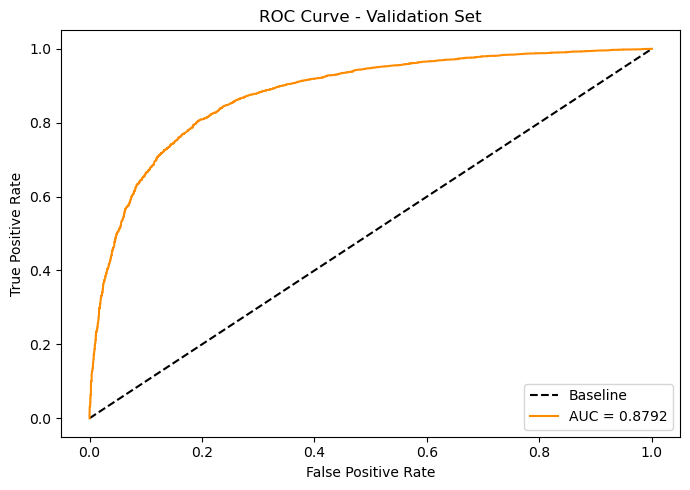


Test Set Evaluation:

==================== RandomForestClassifier Evaluation on Test Set ====================


Classification Metrics:
Accuracy: 0.8048
Precision: 0.8059
Recall: 0.8024
F1-Score: 0.8041
AUC-ROC: 0.8801

Confusion Matrix - Test Set:
      0     1
0  3247   776
1   793  3221


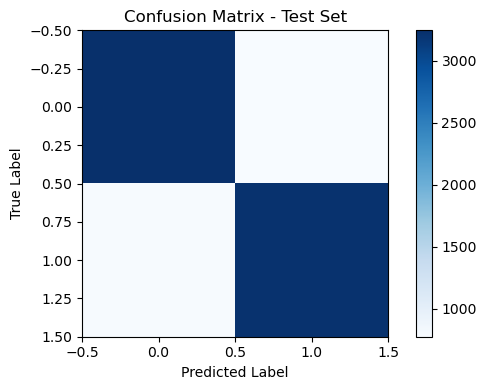

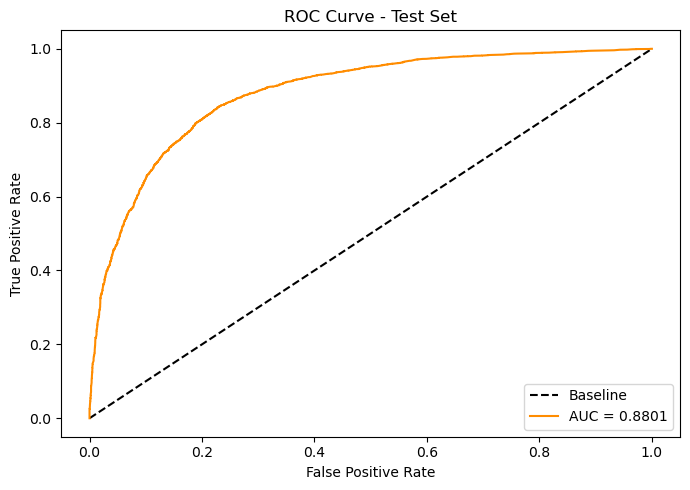

In [46]:
from sklearn.ensemble import RandomForestClassifier

# Define the hyperparameter grid for Random Forest
param_grid_rf = {
    'n_estimators': [50, 100, 200],
    'max_depth': [10, 20, 30],
    'min_samples_split': [2, 5, 10],
    'min_samples_leaf': [1, 2, 4]
}

# Instantiate the Random Forest model with a random state for reproducibility
rf_model = RandomForestClassifier(random_state=42)

# Optimize and evaluate the Random Forest model using GridSearchCV
print("\nStarting Random Forest Model Optimization...\n")
best_rf_model = optimize_and_evaluate_model(
    rf_model, param_grid_rf, 
    X_train_scaled_1, y_train_1, 
    X_valid_scaled_1, y_valid_1, 
    X_test_scaled_1, y_test_1, 
    set_name="Random Forest"
)

# Final evaluation of the best Random Forest model on validation and test sets
print("\nFinal Evaluation of the Optimized Random Forest Model:")
train_and_evaluate_model(best_rf_model, X_train_scaled_1, y_train_1, X_valid_scaled_1, y_valid_1, X_test_scaled_1, y_test_1)



Starting XGBoost Model Optimization...


Optimizing XGBClassifier with GridSearchCV for XGBoost set...

Best Parameters found for XGBoost set - XGBClassifier:
Best Parameters: {'colsample_bytree': 0.9, 'learning_rate': 0.1, 'max_depth': 5, 'n_estimators': 200, 'subsample': 0.9}
Best CV Score: 0.7250

Evaluating Best XGBoost Model:

Training the XGBClassifier model...


==================== XGBClassifier Training Complete ====================


Validation Set Evaluation:

==================== XGBClassifier Evaluation on Validation Set ====================


Classification Metrics:
Accuracy: 0.7255
Precision: 0.7551
Recall: 0.6620
F1-Score: 0.7055
AUC-ROC: 0.8038

Confusion Matrix - Validation Set:
      0     1
0  3188   857
1  1349  2642


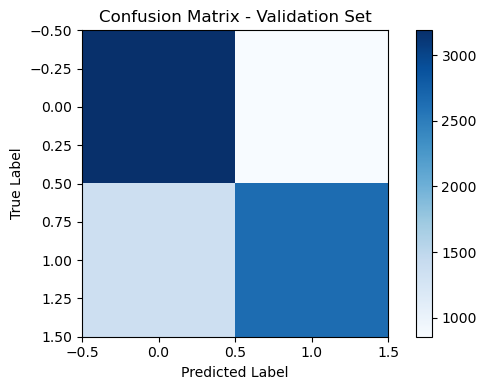

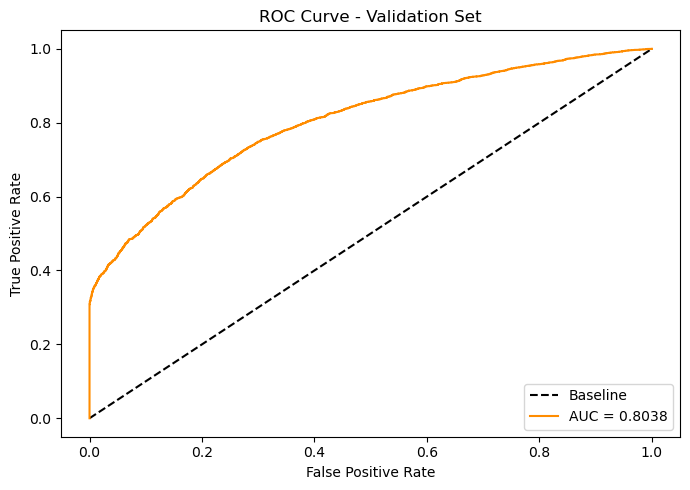


Test Set Evaluation:

==================== XGBClassifier Evaluation on Test Set ====================


Classification Metrics:
Accuracy: 0.7213
Precision: 0.7490
Recall: 0.6647
F1-Score: 0.7043
AUC-ROC: 0.8032

Confusion Matrix - Test Set:
      0     1
0  3129   894
1  1346  2668


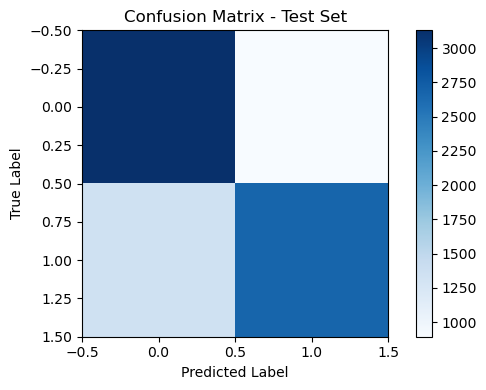

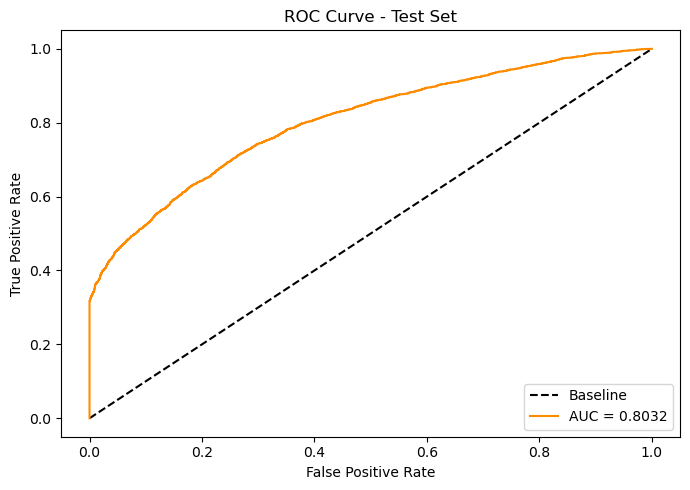


Final Evaluation of the Optimized XGBoost Model:

Training the XGBClassifier model...


==================== XGBClassifier Training Complete ====================


Validation Set Evaluation:

==================== XGBClassifier Evaluation on Validation Set ====================


Classification Metrics:
Accuracy: 0.7255
Precision: 0.7551
Recall: 0.6620
F1-Score: 0.7055
AUC-ROC: 0.8038

Confusion Matrix - Validation Set:
      0     1
0  3188   857
1  1349  2642


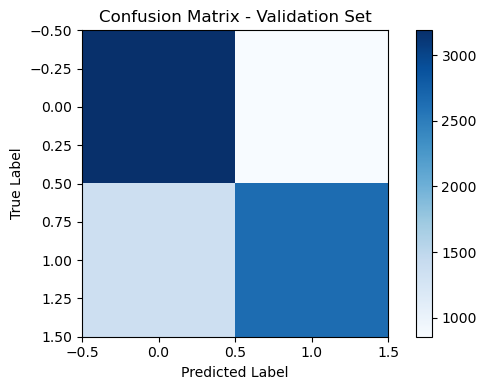

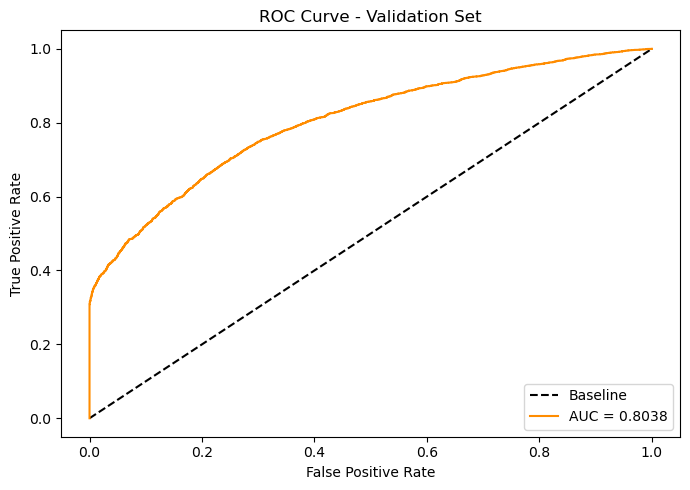


Test Set Evaluation:

==================== XGBClassifier Evaluation on Test Set ====================


Classification Metrics:
Accuracy: 0.7213
Precision: 0.7490
Recall: 0.6647
F1-Score: 0.7043
AUC-ROC: 0.8032

Confusion Matrix - Test Set:
      0     1
0  3129   894
1  1346  2668


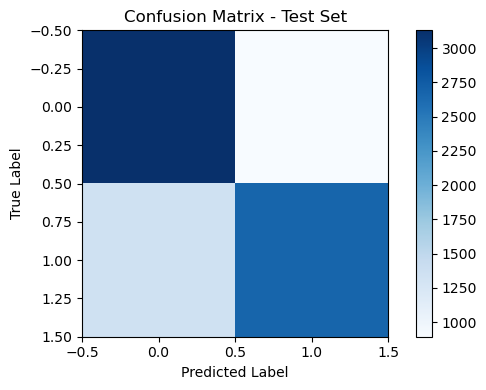

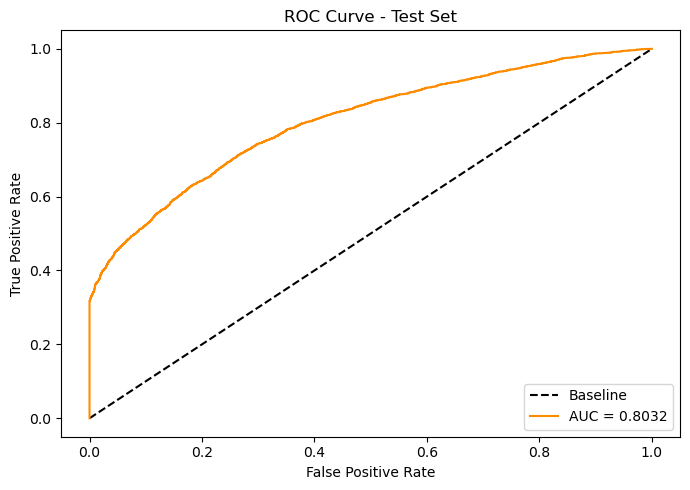

In [47]:
import xgboost as xgb

# Define the hyperparameter grid for XGBoost
param_grid_xgb = {
    'max_depth': [3, 4, 5],
    'learning_rate': [0.1, 0.01, 0.001],
    'n_estimators': [50, 100, 200],
    'subsample': [0.8, 0.9, 1.0],
    'colsample_bytree': [0.8, 0.9, 1.0]
}

# Initialize XGBoost model with the specific objective and number of classes
xgb_model = xgb.XGBClassifier(random_state=42, objective='multi:softmax', num_class=9)

# Optimize and evaluate the XGBoost model using GridSearchCV
print("\nStarting XGBoost Model Optimization...\n")
best_xgb_model = optimize_and_evaluate_model(
    xgb_model, param_grid_xgb, 
    X_train_scaled_1, y_train_1, 
    X_valid_scaled_1, y_valid_1, 
    X_test_scaled_1, y_test_1, 
    set_name="XGBoost"
)

# Final evaluation of the best XGBoost model on validation and test sets
print("\nFinal Evaluation of the Optimized XGBoost Model:")
train_and_evaluate_model(best_xgb_model, X_train_scaled_1, y_train_1, X_valid_scaled_1, y_valid_1, X_test_scaled_1, y_test_1)



===== RandomForestClassifier Performance on Test Set =====
Accuracy: 0.8048
Precision: 0.8048
Recall: 0.8048
F1 Score: 0.8048
ROC AUC: 0.8048

Confusion Matrix (Test Set):
       0     1
0  3247   776
1   793  3221


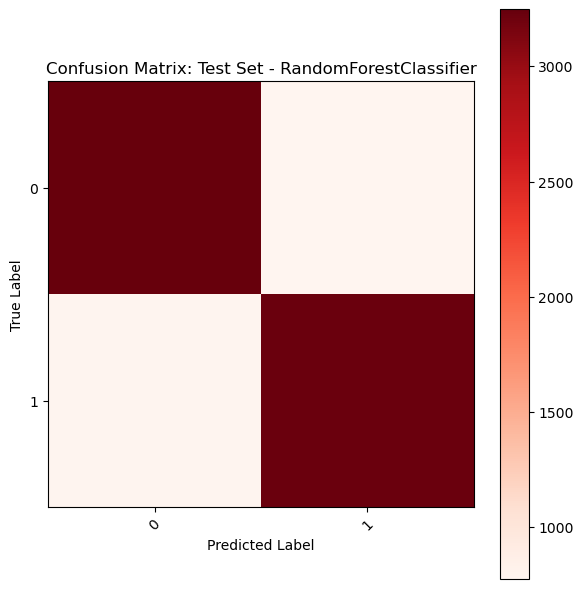


Classification Report (Test Set):

              precision    recall  f1-score   support

           0       0.80      0.81      0.81      4023
           1       0.81      0.80      0.80      4014

    accuracy                           0.80      8037
   macro avg       0.80      0.80      0.80      8037
weighted avg       0.80      0.80      0.80      8037



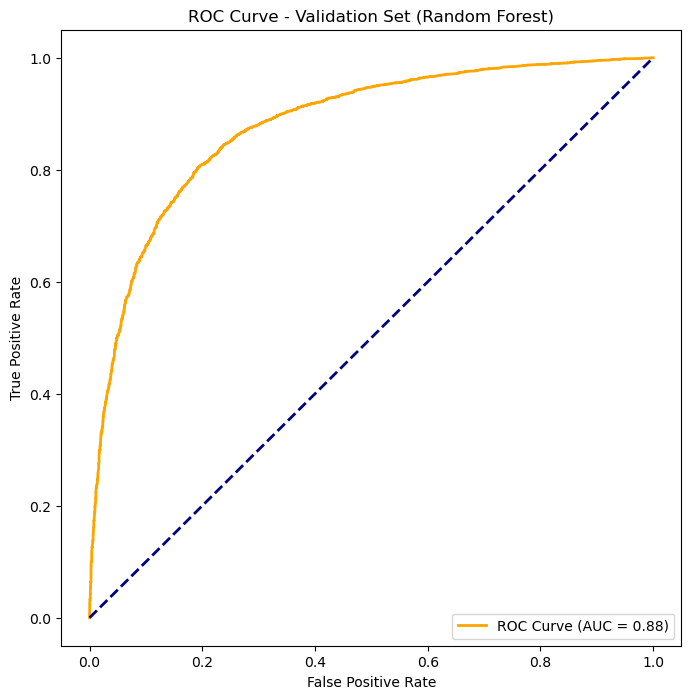

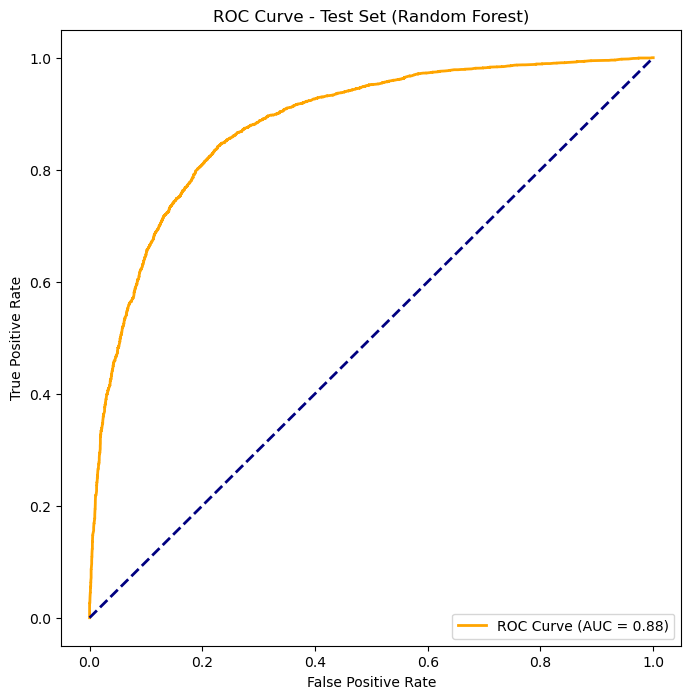

In [48]:
from sklearn.metrics import (
    accuracy_score, precision_score, recall_score, f1_score, 
    roc_auc_score, confusion_matrix, classification_report, 
    roc_curve, auc, precision_recall_curve
)
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np

def evaluate_model_performance(model, X, y_true, dataset_name=""):
    """
    Evaluate a classification model on a dataset by computing various metrics.

    Parameters:
    - model: Trained model to evaluate.
    - X: Feature matrix.
    - y_true: True labels.
    - dataset_name: Name of the dataset (e.g., Train, Validation, Test).
    """
    # Predict the labels
    y_pred = model.predict(X)
    
    # Ensure true labels are in a 1D format
    if hasattr(y_true, 'values'):
        y_true = y_true.values.ravel()

    # Compute evaluation metrics
    accuracy = accuracy_score(y_true, y_pred)
    precision = precision_score(y_true, y_pred, average='weighted')
    recall = recall_score(y_true, y_pred, average='weighted')
    f1 = f1_score(y_true, y_pred, average='weighted')
    roc_auc = roc_auc_score(y_true, y_pred)
    conf_matrix = confusion_matrix(y_true, y_pred)
    
    # Display evaluation results
    print(f"\n===== {type(model).__name__} Performance on {dataset_name} Set =====")
    print(f"Accuracy: {accuracy:.4f}")
    print(f"Precision: {precision:.4f}")
    print(f"Recall: {recall:.4f}")
    print(f"F1 Score: {f1:.4f}")
    print(f"ROC AUC: {roc_auc:.4f}")
    
    # Generate a DataFrame for the Confusion Matrix
    cm_df = pd.DataFrame(conf_matrix, index=model.classes_, columns=model.classes_)
    print(f"\nConfusion Matrix ({dataset_name} Set):\n", cm_df)
    
    # Plot confusion matrix
    plot_confusion_matrix(cm_df, dataset_name, model)

    # Classification report
    print(f"\nClassification Report ({dataset_name} Set):\n")
    print(classification_report(y_true, y_pred))

def plot_confusion_matrix(conf_matrix, dataset_name, model):
    """
    Plot a confusion matrix for a classification model.

    Parameters:
    - conf_matrix: Confusion matrix DataFrame.
    - dataset_name: Name of the dataset.
    - model: The classification model used.
    """
    plt.figure(figsize=(6, 6))
    plt.imshow(conf_matrix, cmap='Reds', interpolation='none')
    plt.title(f'Confusion Matrix: {dataset_name} Set - {type(model).__name__}')
    plt.colorbar()
    plt.xticks(ticks=np.arange(len(conf_matrix.columns)), labels=conf_matrix.columns, rotation=45)
    plt.yticks(ticks=np.arange(len(conf_matrix.index)), labels=conf_matrix.index)
    plt.ylabel('True Label')
    plt.xlabel('Predicted Label')
    plt.tight_layout()
    plt.show()

def plot_roc(fpr, tpr, auc_score, dataset_name="", model_name=""):
    """
    Plot the ROC Curve for a classification model.

    Parameters:
    - fpr: False Positive Rate.
    - tpr: True Positive Rate.
    - auc_score: Area under the curve.
    - dataset_name: Name of the dataset.
    - model_name: Model name for the plot title.
    """
    plt.figure(figsize=(8, 8))
    plt.plot(fpr, tpr, label=f'ROC Curve (AUC = {auc_score:.2f})', color='orange', lw=2)
    plt.plot([0, 1], [0, 1], linestyle='--', color='navy', lw=2)
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.title(f'ROC Curve - {dataset_name} Set ({model_name})')
    plt.legend(loc='lower right')
    plt.show()


# Train the Random Forest Model
best_rf_model.fit(X_train_scaled_1, y_train_1)

# Validation Predictions and ROC Curve
y_valid_pred_proba = best_rf_model.predict_proba(X_valid_scaled_1)[:, 1]

# Precision-Recall Curve Calculation
precision, recall, thresholds = precision_recall_curve(y_valid_1, y_valid_pred_proba)

# Find the threshold for a desired precision-recall trade-off
target_precision = 0.85
target_recall = 0.85
closest_idx = np.argmin(np.abs(precision - target_precision) + np.abs(recall - target_recall))
optimal_threshold = thresholds[closest_idx]

# Apply the optimal threshold to validation and test predictions
adjusted_valid_preds = (y_valid_pred_proba >= optimal_threshold).astype(int)
adjusted_test_preds = (best_rf_model.predict_proba(X_test_scaled_1)[:, 1] >= optimal_threshold).astype(int)

# Evaluate model performance with adjusted predictions
evaluate_model_performance(best_rf_model, X_test_scaled_1, y_test_1, dataset_name="Test")

# Compute ROC for both validation and test sets
fpr_valid, tpr_valid, _ = roc_curve(y_valid_1, y_valid_pred_proba)
roc_auc_valid = auc(fpr_valid, tpr_valid)

fpr_test, tpr_test, _ = roc_curve(y_test_1, best_rf_model.predict_proba(X_test_scaled_1)[:, 1])
roc_auc_test = auc(fpr_test, tpr_test)

# Plot ROC curves
plot_roc(fpr_valid, tpr_valid, roc_auc_valid, dataset_name="Validation", model_name="Random Forest")
plot_roc(fpr_test, tpr_test, roc_auc_test, dataset_name="Test", model_name="Random Forest")


In [58]:
#Evaluate Cross-Validation Stability of Model A
# Define the parameter grid for hyperparameter tuning
param_grid = {
'n_estimators': [50, 100, 200],
'max_depth': [10, 20, 30],
'min_samples_split': [2, 5, 10],
'min_samples_leaf': [1, 2, 4]
}
# Create GridSearchCV
grid_search = GridSearchCV(estimator=best_rf_model, param_grid=param_grid, cv=5, scoring='accuracy', n_jobs=-1, verbose=2)
# Fit the model on the training data
grid_search.fit(X_train_scaled_1, y_train_1)
# Access cross-validation results
cv_results = grid_search.cv_results_

Fitting 5 folds for each of 81 candidates, totalling 405 fits


In [59]:
# Print performance metrics for each fold
for i in range(grid_search.n_splits_):
  print(f"\nResults for Fold {i + 1}:")
  print(f"Mean Test Score: {cv_results[f'mean_test_score'][i]}")
  print(f"Standard Deviation Test Score: {cv_results[f'std_test_score'][i]}")
  print(f"Params: {cv_results['params'][i]}")


Results for Fold 1:
Mean Test Score: 0.6801263536401752
Standard Deviation Test Score: 0.00416582930003321
Params: {'max_depth': 10, 'min_samples_leaf': 1, 'min_samples_split': 2, 'n_estimators': 50}

Results for Fold 2:
Mean Test Score: 0.6816350826717402
Standard Deviation Test Score: 0.0025292434157193947
Params: {'max_depth': 10, 'min_samples_leaf': 1, 'min_samples_split': 2, 'n_estimators': 100}

Results for Fold 3:
Mean Test Score: 0.6827394486529785
Standard Deviation Test Score: 0.0024241055046142087
Params: {'max_depth': 10, 'min_samples_leaf': 1, 'min_samples_split': 2, 'n_estimators': 200}

Results for Fold 4:
Mean Test Score: 0.6814328279644963
Standard Deviation Test Score: 0.0033573024504930343
Params: {'max_depth': 10, 'min_samples_leaf': 1, 'min_samples_split': 5, 'n_estimators': 50}

Results for Fold 5:
Mean Test Score: 0.682070584999771
Standard Deviation Test Score: 0.0024579291548511356
Params: {'max_depth': 10, 'min_samples_leaf': 1, 'min_samples_split': 5, 'n_est

In [43]:
# Overfitting Analysis for Model
# Function to plot learning curve
def plot_learning_curve(estimator, title, X, y, ylim=None, cv=None,n_jobs=-1, train_sizes=np.linspace(.1, 1.0, 5)):
  plt.figure()
  plt.title(title)

  if ylim is not None:
    plt.ylim(*ylim)

  plt.xlabel("Training examples")
  plt.ylabel("F1 Score")

  train_sizes, train_scores, test_scores = learning_curve(estimator, X, y, cv=cv, n_jobs=n_jobs, train_sizes=train_sizes, scoring='f1_macro')
  train_scores_mean = np.mean(train_scores, axis=1)
  train_scores_std = np.std(train_scores, axis=1)
  test_scores_mean = np.mean(test_scores, axis=1)
  test_scores_std = np.std(test_scores, axis=1)
  plt.grid()

  plt.fill_between(train_sizes, train_scores_mean - train_scores_std,train_scores_mean + train_scores_std, alpha=0.1,  color="r")
  plt.fill_between(train_sizes, test_scores_mean - test_scores_std,test_scores_mean + test_scores_std, alpha=0.1, color="g")
  plt.plot(train_sizes, train_scores_mean, 'o-', color="r",label="Training score")
  plt.plot(train_sizes, test_scores_mean, 'o-', color="g",label="Cross-validation score")
  plt.legend(loc="best")

  # Print calculations
  print(f"Train Sizes: {train_sizes}")
  print(f"Training Scores Mean: {train_scores_mean}")
  print(f"Training Scores Std: {train_scores_std}")
  print(f"Test Scores Mean: {test_scores_mean}")
  print(f"Test Scores Std: {test_scores_std}")
  return plt


In [44]:
 # Plot learning curve
title = "Learning Curve (Random Forest) for Model"
cv = 5 # Cross-validation folds
plot_learning_curve(best_rf_model, title, X_train_scaled_1, y_train_1, cv=cv)
plt.show()

NameError: name 'best_rf_model' is not defined

In [45]:
# Drop 'success' and 'transaction_fee' columns from the original DataFrame
X_original = df.drop(['success', 'transaction_fee'], axis=1)
# One-hot encode categorical columns: 'country', 'PSP', 'card'
X_original_encoded = pd.get_dummies(X_original, columns=['country', 'PSP', 'card'])
# Identify additional columns in X_original_encoded not present in X_train_1
additional_columns = set(X_original_encoded.columns) - set(X_train_1.columns)
if additional_columns:
  print(f"Additional columns in X_original_encoded: {additional_columns}")
# Identify missing columns in X_original_encoded compared to X_train_1
missing_columns = set(X_train_1.columns) - set(X_original_encoded.columns)
if missing_columns:
  print(f"Missing columns in X_original_encoded: {missing_columns}")
# Keep only columns present in X_train_1 in X_original_encoded
X_original_encoded = X_original_encoded[X_train_1.columns]
# Scale the features using the previously defined 'scaler'
X_original_scaled = scaler.transform(X_original_encoded)
# Predict success probabilities using the trained random forest Model A
success_probabilities = xgb_model.predict_proba(X_original_scaled)[:, 1]
# Add the success probabilities as a new column to the original DataFrame
df['success_probabilities'] = success_probabilities
# Display the updated DataFrame
print(df)

           country  amount  success         PSP  3D_secured    card  \
0          Austria       6        0   Moneycard           0  Diners   
1          Austria       6        0  Simplecard           0  Diners   
2          Austria       6        0     UK_Card           0  Diners   
3          Austria       6        0     UK_Card           0  Diners   
4          Austria       6        0  Simplecard           0  Diners   
...            ...     ...      ...         ...         ...     ...   
50405  Switzerland     499        0     UK_Card           0  Master   
50406  Switzerland     499        0     UK_Card           0  Master   
50407  Switzerland     499        0     UK_Card           0  Master   
50408  Switzerland     499        0     UK_Card           0  Master   
50409  Switzerland     499        0     UK_Card           0  Master   

       transaction_fee  day_of_week  minute_of_day  payment_attempts  \
0                  2.0            3            229                 1   
1  

In [46]:
df_2 = df.copy()

df_encoded_2 = pd.get_dummies(df_2, columns=['country', 'card'])
print(df_encoded_2)

       amount  success         PSP  3D_secured  transaction_fee  day_of_week  \
0           6        0   Moneycard           0              2.0            3   
1           6        0  Simplecard           0              0.5            3   
2           6        0     UK_Card           0              1.0            4   
3           6        0     UK_Card           0              1.0            4   
4           6        0  Simplecard           0              0.5            4   
...       ...      ...         ...         ...              ...          ...   
50405     499        0     UK_Card           0              1.0            3   
50406     499        0     UK_Card           0              1.0            3   
50407     499        0     UK_Card           0              1.0            3   
50408     499        0     UK_Card           0              1.0            3   
50409     499        0     UK_Card           0              1.0            3   

       minute_of_day  payment_attempts 

In [47]:
X = df_encoded_2.drop(['PSP', 'success'], axis=1)
y = df_encoded_2['PSP']
X_train, X_temp, y_train, y_temp = train_test_split(X, y, test_size=0.2, random_state=42)
X_val, X_test, y_val, y_test = train_test_split(X_temp, y_temp, test_size=0.5, random_state=42)
knn_model = KNeighborsClassifier(n_neighbors=5)
knn_model.fit(X_train, y_train)

KNeighborsClassifier()

In [48]:
X_2 = df_encoded_2.drop(['PSP', 'success'], axis=1)
scaler = StandardScaler()
X_scaled_2 = scaler.fit_transform(X_2)
df_scaled_2 = pd.DataFrame(X_scaled_2, columns=X_2.columns)
df_scaled_2[['PSP']] = df_encoded_2[['PSP']]
print(df_scaled_2)

         amount  3D_secured  transaction_fee  day_of_week  minute_of_day  \
0     -2.039971    -0.55928         0.134244     0.125262      -1.180246   
1     -2.039971    -0.55928        -0.692643     0.125262      -1.180246   
2     -2.039971    -0.55928        -0.417014     0.646728      -1.004572   
3     -2.039971    -0.55928        -0.417014     0.646728      -1.004572   
4     -2.039971    -0.55928        -0.692643     0.646728      -1.004572   
...         ...         ...              ...          ...            ...   
50405  3.080842    -0.55928        -0.417014     0.125262      -1.136929   
50406  3.080842    -0.55928        -0.417014     0.125262      -1.136929   
50407  3.080842    -0.55928        -0.417014     0.125262      -1.134522   
50408  3.080842    -0.55928        -0.417014     0.125262      -1.134522   
50409  3.080842    -0.55928        -0.417014     0.125262      -1.132116   

       payment_attempts  success_probabilities  country_Austria  \
0             -0.531

In [66]:
# Split the scaled DataFrame into features (X_smote_2) and target variable (y_smote_2)
X_smote_2 = df_scaled_2.drop('PSP', axis=1)
y_smote_2 = df_scaled_2['PSP']
# Initialize the SMOTE with a random state
smote_2 = SMOTE(random_state=42)
# Resample the dataset using SMOTE
X_resampled_2, y_resampled_2 = smote_2.fit_resample(X_smote_2, y_smote_2)
# Create a DataFrame with resampled features and include the 'PSP' column
df_2_resampled = pd.DataFrame(X_resampled_2, columns=X_smote_2.columns)
df_2_resampled['PSP'] = y_resampled_2
# Print the resampled DataFrame
print(df_2_resampled)

          amount  3D_secured  transaction_fee  day_of_week  minute_of_day  \
0      -2.039971   -0.559280         0.134244     0.125262      -1.180246   
1      -2.039971   -0.559280        -0.692643     0.125262      -1.180246   
2      -2.039971   -0.559280        -0.417014     0.646728      -1.004572   
3      -2.039971   -0.559280        -0.417014     0.646728      -1.004572   
4      -2.039971   -0.559280        -0.692643     0.646728      -1.004572   
...          ...         ...              ...          ...            ...   
105831 -1.828316   -0.559280        -0.692643    -1.439138      -1.383791   
105832 -1.159684    1.788012        -0.692643     1.168195      -1.536938   
105833 -0.085479   -0.559280        -0.661659    -0.396205       0.147578   
105834 -0.412413   -0.559280        -0.692643    -0.917672       1.224076   
105835  1.366484   -0.559280        -0.692643    -0.917672       0.359207   

        payment_attempts  success_probabilities  country_Austria  \
0      

In [49]:

X_2 = df_2_resampled.drop('PSP', axis=1)
y_2 = df_2_resampled['PSP']

X_train_2, X_temp_2, y_train_2, y_temp_2 = train_test_split(X_2, y_2, test_size=0.2, random_state=42)
X_valid_2, X_test_2, y_valid_2, y_test_2 = train_test_split(X_temp_2, y_temp_2, test_size=0.5,random_state=42)
# Normalize Data
scaler = StandardScaler()
X_train_scaled_2 = scaler.fit_transform(X_train_2)
X_valid_scaled_2 = scaler.transform(X_valid_2)
X_test_scaled_2 = scaler.transform(X_test_2)

NameError: name 'df_2_resampled' is not defined

In [56]:
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.metrics import (
    accuracy_score,
    precision_score,
    recall_score,
    f1_score,
    roc_auc_score,
    confusion_matrix,
    classification_report,
)

def evaluate_model_performance(model, X, y):
    """
    Evaluate the model's performance using various metrics.

    Args:
        model: The trained model to evaluate.
        X (pd.DataFrame): The feature data.
        y (pd.Series): The target data.

    Returns:
        dict: A dictionary containing evaluation metrics.
    """
    # Make predictions
    y_pred = model.predict(X)
    y_values = y.values.ravel()  # Convert DataFrame to 1D array

    # Calculate metrics
    metrics = {
        'precision': precision_score(y_values, y_pred, average='weighted'),
        'recall': recall_score(y_values, y_pred, average='weighted'),
        'f1_score': f1_score(y_values, y_pred, average='weighted'),
        'accuracy': accuracy_score(y_values, y_pred),
    }

    # ROC AUC calculation
    if len(model.classes_) == 2:
        metrics['roc_auc'] = roc_auc_score(y_values, model.predict_proba(X)[:, 1])
    else:
        metrics['roc_auc'] = roc_auc_score(
            pd.get_dummies(y_values), model.predict_proba(X), average='weighted', multi_class='ovr'
        )

    return metrics, y_pred

def print_evaluation_results(metrics, set_name, model_name):
    """
    Print the evaluation results.

    Args:
        metrics (dict): A dictionary containing evaluation metrics.
        set_name (str): Name of the data set (e.g., "Validation" or "Test").
        model_name (str): Name of the model being evaluated.
    """
    print(f'\n{"="*20} {model_name} {"="*20}\n')
    print(f'{set_name} Set Evaluation: {model_name}')
    for metric, value in metrics.items():
        print(f"{metric.replace('_', ' ').capitalize()}: {value:.4f}")

def plot_confusion_matrix(y_true, y_pred, model_name, set_name):
    """
    Plot the confusion matrix.

    Args:
        y_true (pd.Series): The true labels.
        y_pred (pd.Series): The predicted labels.
        model_name (str): The name of the model being evaluated.
        set_name (str): Name of the data set.
    """
    cm = confusion_matrix(y_true, y_pred)
    cm_df = pd.DataFrame(cm, index=model_name.classes_, columns=model_name.classes_)

    print(f'\n{"="*20}{"="*20}\n')
    print(f'Confusion Matrix: {set_name} set - {model_name}\n')
    print("Confusion Matrix:")
    print(cm_df)

    plt.figure()
    plt.imshow(cm_df, cmap='Reds')
    plt.title(f'Confusion Matrix: {set_name} Set Evaluation - {model_name}')
    plt.colorbar()
    plt.xlabel('Predicted label')
    plt.ylabel('True label')
    plt.tick_params(axis='both', which='major', labelsize=8)
    plt.tight_layout()
    plt.show()

def evaluate_model(model, X, y, set_name):
    """
    Evaluate the model and print relevant metrics and plots.

    Args:
        model: The trained model to evaluate.
        X (pd.DataFrame): The feature data.
        y (pd.Series): The target data.
        set_name (str): Name of the data set (e.g., "Validation" or "Test").
    """
    # Get model performance metrics
    metrics, y_pred = evaluate_model_performance(model, X, y)

    # Print evaluation results
    print_evaluation_results(metrics, set_name, type(model).__name__)

    # Print classification report
    print(f'\n{"="*20}{"="*20}\n')
    print(f'Classification Report: {set_name} set - {type(model).__name__}\n')
    print(classification_report(y, y_pred))

    # Plot confusion matrix
    plot_confusion_matrix(y, y_pred, model, set_name)


In [58]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import cross_val_score, StratifiedKFold
import numpy as np

def create_random_forest_model(n_estimators=100, max_depth=None, random_state=42):
    """
    Create a Random Forest classifier model.

    Args:
        n_estimators (int): Number of trees in the forest.
        max_depth (int or None): Maximum depth of the trees.
        random_state (int): Seed for reproducibility.

    Returns:
        RandomForestClassifier: A configured Random Forest model.
    """
    return RandomForestClassifier(random_state=random_state, n_estimators=n_estimators, max_depth=max_depth)

def perform_cross_validation(model, X, y, cv_folds=5, scoring='f1_weighted'):
    """
    Perform cross-validation on the given model and dataset.

    Args:
        model: The model to evaluate.
        X (pd.DataFrame): The feature data.
        y (pd.Series): The target data.
        cv_folds (int): Number of cross-validation folds.
        scoring (str): Scoring method for evaluation.

    Returns:
        np.ndarray: Cross-validation scores.
    """
    cv = StratifiedKFold(n_splits=cv_folds)
    scores = cross_val_score(model, X, y, scoring=scoring, cv=cv)
    return scores

def train_and_evaluate_rf_model(X_train, y_train):
    """
    Train a Random Forest model and evaluate its performance.

    Args:
        X_train (pd.DataFrame): The feature data for training.
        y_train (pd.Series): The target data for training.
    """
    # Create the Random Forest model
    rf_model = create_random_forest_model()

    # Perform cross-validation
    cv_scores_rf = perform_cross_validation(rf_model, X_train, y_train)

    # Print cross-validation scores
    print("Cross-Validation Scores:\n", cv_scores_rf)
    print(f"Average F1 Weighted Score: {cv_scores_rf.mean():.4f}")

    # Fit the model to the training data
    rf_model.fit(X_train, y_train)

    return rf_model

# Usage example
rf_model_B = train_and_evaluate_rf_model(X_train_scaled_2, y_train_2)


NameError: name 'X_train_scaled_2' is not defined

Model Performance on Validation set - Random Forest::

==================== RandomForestClassifier ====================

Validation Set Evaluation: RandomForestClassifier
Precision: 0.9780
Recall: 0.9776
F1 Score: 0.9776
ROC AUC: 0.9985
Accuracy: 0.9776


Classification Report: Validation set - RandomForestClassifier  

              precision    recall  f1-score   support

    Goldcard       0.94      0.98      0.96      2608
   Moneycard       0.98      0.93      0.96      2620
  Simplecard       1.00      1.00      1.00      2626
     UK_Card       0.99      1.00      1.00      2730

    accuracy                           0.98     10584
   macro avg       0.98      0.98      0.98     10584
weighted avg       0.98      0.98      0.98     10584

              precision    recall  f1-score   support

    Goldcard       0.94      0.98      0.96      2608
   Moneycard       0.98      0.93      0.96      2620
  Simplecard       1.00      1.00      1.00      2626
     UK_Card       0.99   

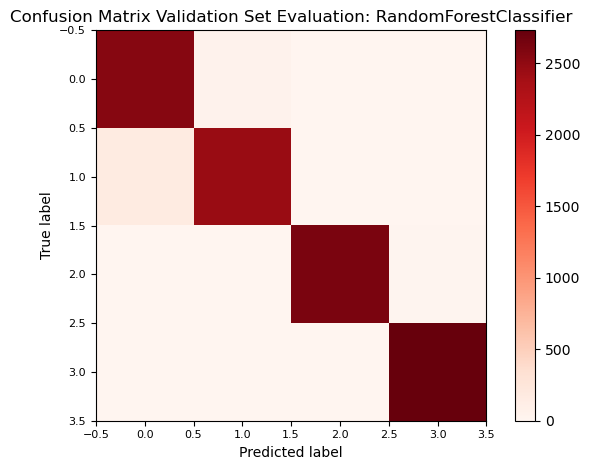


Model Performance on Test set - Random Forest::

==================== RandomForestClassifier ====================

Test Set Evaluation: RandomForestClassifier
Precision: 0.9802
Recall: 0.9800
F1 Score: 0.9800
ROC AUC: 0.9981
Accuracy: 0.9800


Classification Report: Test set - RandomForestClassifier  

              precision    recall  f1-score   support

    Goldcard       0.95      0.98      0.96      2590
   Moneycard       0.98      0.95      0.96      2621
  Simplecard       1.00      1.00      1.00      2649
     UK_Card       1.00      1.00      1.00      2724

    accuracy                           0.98     10584
   macro avg       0.98      0.98      0.98     10584
weighted avg       0.98      0.98      0.98     10584

              precision    recall  f1-score   support

    Goldcard       0.95      0.98      0.96      2590
   Moneycard       0.98      0.95      0.96      2621
  Simplecard       1.00      1.00      1.00      2649
     UK_Card       1.00      1.00      1.00

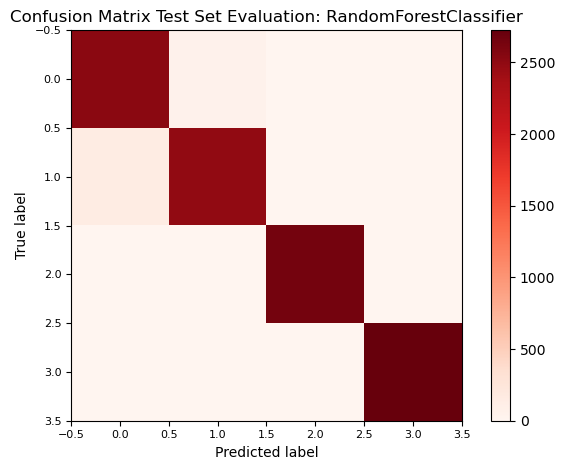

In [70]:
# Fit the Logistic Regression model on the training set
rf_model_B.fit(X_train_scaled_2, y_train_2)
# Print model performance on the validation set
print("Model Performance on Validation set - Random Forest::")
evaluate_model2(rf_model_B, X_valid_scaled_2, y_valid_2, set_name="Validation")
# Print model performance on the test set
print("\nModel Performance on Test set - Random Forest::")
evaluate_model2(rf_model_B, X_test_scaled_2, y_test_2, set_name="Test")

In [71]:
# Random Forest Model B after hyperparameter tuning and cross-validation
# Create a Random Forest model with a set random state
rf_model = RandomForestClassifier(random_state=42)
# Define the parameter grid for hyperparameter tuning
param_grid = {
'n_estimators': [50, 100, 200],
'max_depth': [10, 20, 30]
}

In [72]:
# Use GridSearchCV for hyperparameter tuning
rf_grid = GridSearchCV(rf_model, param_grid, scoring='f1_weighted', cv=StratifiedKFold(n_splits=5), verbose=1)
rf_grid.fit(X_train_scaled_2, y_train_2)
# Get the best model from the grid search
rf_best_model = rf_grid.best_estimator_
# Print the best hyperparameters found
print("Best Hyperparameters:", rf_grid.best_params_)

Fitting 5 folds for each of 9 candidates, totalling 45 fits
Best Hyperparameters: {'max_depth': 30, 'n_estimators': 200}


In [73]:
# Perform cross-validation on the training set with the best model
cv_scores_rf = cross_val_score(rf_best_model, X_train_scaled_2, y_train_2, scoring='f1_weighted', cv=StratifiedKFold(n_splits=5))
# Print cross-validation scores
print("Cross-Validation Scores with Best Model of Random Forest Classification:")
print(cv_scores_rf)
print(f"Average F1 Weighted Score: {cv_scores_rf.mean():.4f}\n")

Cross-Validation Scores with Best Model of Random Forest Classification:
[0.97689023 0.97499707 0.97557912 0.97339557 0.97516384]
Average F1 Weighted Score: 0.9752



Model Performance on Validation set - RandomForestClassifier:

==================== RandomForestClassifier ====================

Validation Set Evaluation: RandomForestClassifier
Precision: 0.9779
Recall: 0.9774
F1 Score: 0.9774
ROC AUC: 0.9986
Accuracy: 0.9774


Classification Report: Validation set - RandomForestClassifier  

              precision    recall  f1-score   support

    Goldcard       0.94      0.98      0.96      2608
   Moneycard       0.98      0.93      0.96      2620
  Simplecard       1.00      1.00      1.00      2626
     UK_Card       0.99      1.00      1.00      2730

    accuracy                           0.98     10584
   macro avg       0.98      0.98      0.98     10584
weighted avg       0.98      0.98      0.98     10584

              precision    recall  f1-score   support

    Goldcard       0.94      0.98      0.96      2608
   Moneycard       0.98      0.93      0.96      2620
  Simplecard       1.00      1.00      1.00      2626
     UK_Card      

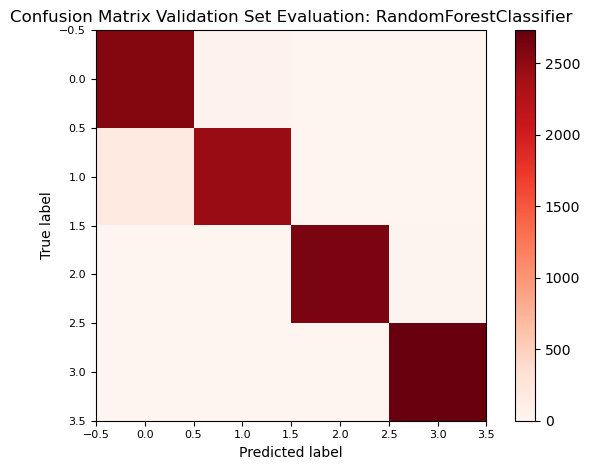

Model Performance on Test set - RandomForestClassifier:

==================== RandomForestClassifier ====================

Test Set Evaluation: RandomForestClassifier
Precision: 0.9806
Recall: 0.9804
F1 Score: 0.9804
ROC AUC: 0.9984
Accuracy: 0.9804


Classification Report: Test set - RandomForestClassifier  

              precision    recall  f1-score   support

    Goldcard       0.95      0.98      0.96      2590
   Moneycard       0.98      0.95      0.96      2621
  Simplecard       1.00      1.00      1.00      2649
     UK_Card       1.00      1.00      1.00      2724

    accuracy                           0.98     10584
   macro avg       0.98      0.98      0.98     10584
weighted avg       0.98      0.98      0.98     10584

              precision    recall  f1-score   support

    Goldcard       0.95      0.98      0.96      2590
   Moneycard       0.98      0.95      0.96      2621
  Simplecard       1.00      1.00      1.00      2649
     UK_Card       1.00      1.00   

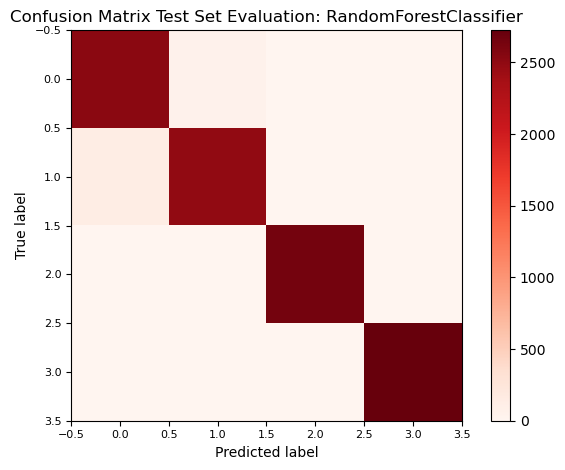

In [74]:
# Fit the best Random Forest model on the training set
rf_best_model.fit(X_train_scaled_2, y_train_2)

# Print model performance on the validation set
print("Model Performance on Validation set - RandomForestClassifier:")
evaluate_model2(rf_best_model, X_valid_scaled_2, y_valid_2, set_name="Validation")

# Print model performance on the test set
print("Model Performance on Test set - RandomForestClassifier:")
evaluate_model2(rf_best_model, X_test_scaled_2, y_test_2, set_name="Test")

Model Performance on Validation set - RandomForestClassifier:


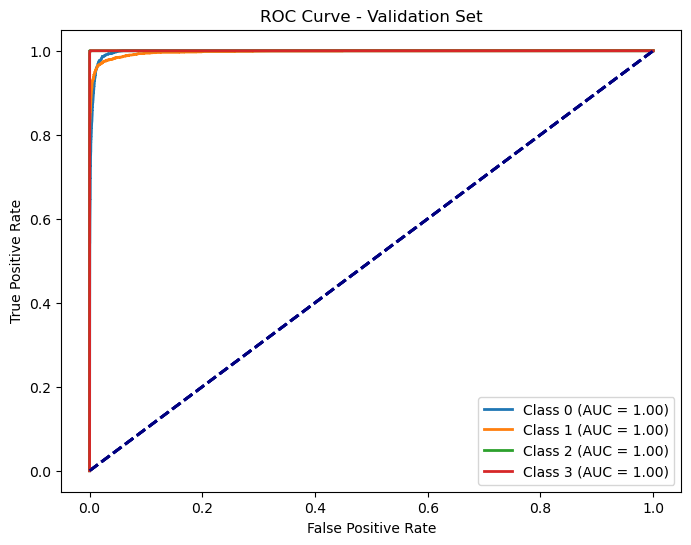

Model Performance on Test set - RandomForestClassifier:


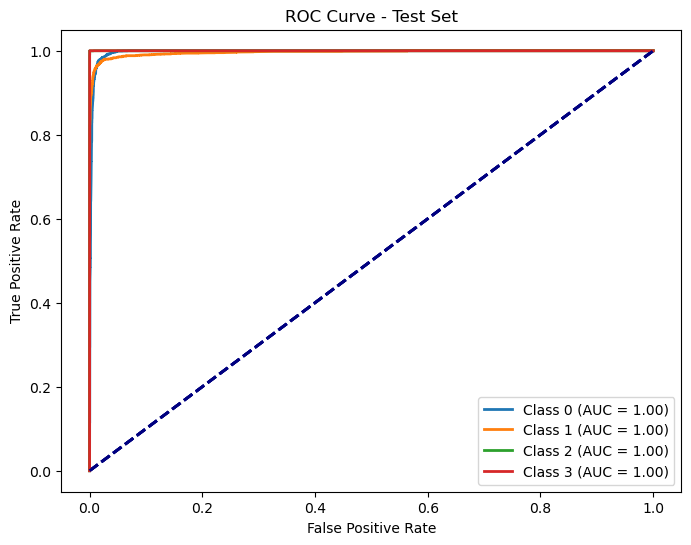

In [77]:
def evaluate_model_with_roc(model, X, y, set_name="Set"):
    lb = LabelBinarizer()
    y_bin = lb.fit_transform(y)
    y_pred_prob = model.predict_proba(X)
    n_classes = y_bin.shape[1]
    fpr = dict()
    tpr = dict()
    roc_auc = dict()
    for i in range(n_classes):
        fpr[i], tpr[i], _ = roc_curve(y_bin[:, i], y_pred_prob[:, i])
        roc_auc[i] = auc(fpr[i], tpr[i])
    # Plot ROC curve
    plt.figure(figsize=(8, 6))
    for i in range(n_classes):
        plt.plot(fpr[i], tpr[i], lw=2, label=f'Class {i} (AUC = {roc_auc[i]:.2f})')
        plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.title(f'ROC Curve - {set_name}')
    plt.legend(loc='lower right')
    plt.show()

# Evaluate on Validation Set with ROC Curve
print("Model Performance on Validation set - RandomForestClassifier:")
evaluate_model_with_roc(rf_best_model, X_valid_scaled_2, y_valid_2, set_name="Validation Set")
# Evaluate on Test Set with ROC Curve
print("Model Performance on Test set - RandomForestClassifier:")
evaluate_model_with_roc(rf_best_model, X_test_scaled_2, y_test_2, set_name="Test Set")

In [78]:
# Cross-Validation stability of Model 2
# Cross-validation scores with the best model
cv_scores_rf = cross_val_score(rf_best_model, X_train_scaled_2, y_train_2, scoring='f1_weighted', cv=StratifiedKFold(n_splits=5))
print("Cross-Validation Scores with Best Model of Random Forest Classification:")
print(cv_scores_rf)
print(f"Average F1 Weighted Score: {cv_scores_rf.mean():.4f}")
print(f"Standard Deviation of F1 Weighted Scores: {cv_scores_rf.std():.4f}")
# Individual cross-validation scores
for i, score in enumerate(cv_scores_rf):
    print(f"Fold {i + 1}: {score:.4f}")
# Train the model on the entire training set
rf_best_model.fit(X_train_scaled_2, y_train_2)

Cross-Validation Scores with Best Model of Random Forest Classification:
[0.97689023 0.97499707 0.97557912 0.97339557 0.97516384]
Average F1 Weighted Score: 0.9752
Standard Deviation of F1 Weighted Scores: 0.0011
Fold 1: 0.9769
Fold 2: 0.9750
Fold 3: 0.9756
Fold 4: 0.9734
Fold 5: 0.9752


RandomForestClassifier(max_depth=30, n_estimators=200, random_state=42)

Train Sizes: [ 6773 22013 37253 52493 67734]
Training Scores Mean: [1.         1.         1.         1.         0.99999114]
Training Scores Std: [0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 7.23267434e-06]
Test Scores Mean: [0.94241253 0.95927315 0.96716287 0.9722744  0.97522818]
Test Scores Std: [0.00124465 0.00097766 0.00075788 0.00100535 0.00105165]


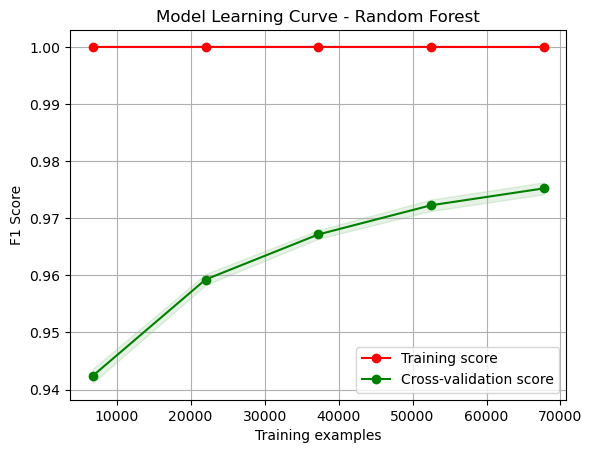

In [79]:
# Overfitting Analysis of Model B
def plot_learning_curve(estimator, title, X, y, ylim=None, cv=None, n_jobs=None,
    train_sizes=np.linspace(.1, 1.0, 5)):
    plt.figure()
    plt.title(title)

    if ylim is not None:
        plt.ylim(*ylim)

    plt.xlabel("Training examples")
    plt.ylabel("F1 Score")

    train_sizes, train_scores, test_scores = learning_curve(estimator, X, y, cv=cv, n_jobs=n_jobs,
    train_sizes=train_sizes, scoring='f1_weighted')

    train_scores_mean = np.mean(train_scores, axis=1)
    train_scores_std = np.std(train_scores, axis=1)
    test_scores_mean = np.mean(test_scores, axis=1)
    test_scores_std = np.std(test_scores, axis=1)
    plt.grid()
    plt.fill_between(train_sizes, train_scores_mean - train_scores_std,train_scores_mean + train_scores_std,
                        alpha=0.1,color="r")
    plt.fill_between(train_sizes, test_scores_mean - test_scores_std,
                        test_scores_mean + test_scores_std, alpha=0.1, color="g")
    plt.plot(train_sizes, train_scores_mean, 'o-', color="r",label="Training score")
    plt.plot(train_sizes, test_scores_mean, 'o-', color="g",label="Cross-validation score")
    plt.legend(loc="best")

      # Print calculations
    print(f"Train Sizes: {train_sizes}")
    print(f"Training Scores Mean: {train_scores_mean}")
    print(f"Training Scores Std: {train_scores_std}")
    print(f"Test Scores Mean: {test_scores_mean}")
    print(f"Test Scores Std: {test_scores_std}")
    return plt
    # Plot learning curves
plot_learning_curve(rf_best_model, "Model Learning Curve - Random Forest",X_train_scaled_2, y_train_2, cv=StratifiedKFold(n_splits=5), n_jobs=-1)
plt.show()

In [80]:
# Optimal PSP prediction for each exiting transaction
# Extract 'PSP' column for comparison
psp_column = df_2['PSP']
# Drop 'PSP' and 'success' columns from the features
X_predict = df_2.drop(['PSP', 'success'], axis=1)
# Define numeric features and apply StandardScaler
numeric_features = ['amount', '3D_secured', 'transaction_fee', 'day_of_week', 'minute_of_day',
                    'payment_attempts', 'success_probabilities']
numeric_transformer = StandardScaler()
# Define categorical features and apply OneHotEncoder
categorical_features = ['country', 'card']
categorical_transformer = OneHotEncoder()
# Create a ColumnTransformer for preprocessing
preprocessor = ColumnTransformer(
transformers=[('num', numeric_transformer, numeric_features),
                ('cat', categorical_transformer, categorical_features)])
# Transform the features using the preprocessor
X_predict_transformed = preprocessor.fit_transform(X_predict)
# Predict the 'PSP' values using the best Random Forest model
df_2['Predicted_PSP'] = rf_best_model.predict(X_predict_transformed)
# Restore the original 'PSP' values for comparison
df_2['PSP'] = psp_column
# Print the DataFrame with predicted 'PSP' values
print(df_2)

           country  amount  success         PSP  3D_secured    card  \
0          Austria       6        0   Moneycard           0  Diners   
1          Austria       6        0  Simplecard           0  Diners   
2          Austria       6        0     UK_Card           0  Diners   
3          Austria       6        0     UK_Card           0  Diners   
4          Austria       6        0  Simplecard           0  Diners   
...            ...     ...      ...         ...         ...     ...   
50405  Switzerland     499        0     UK_Card           0  Master   
50406  Switzerland     499        0     UK_Card           0  Master   
50407  Switzerland     499        0     UK_Card           0  Master   
50408  Switzerland     499        0     UK_Card           0  Master   
50409  Switzerland     499        0     UK_Card           0  Master   

       transaction_fee  day_of_week  minute_of_day  payment_attempts  \
0                  2.0            3            229                 1   
1  

In [81]:
def choose_best_psp(row):
    if pd.Series(row['Predicted_PSP']).nunique() == 1:
    # No tie, return the predicted PSP
        return row['Predicted_PSP']
    else:
        # There is a tie, choose the most cost-effective PSP based on fee comparison
        min_fee_psp = row.loc[row['transaction_fee'].idxmin()]['Predicted_PSP']
        # Filter rows with tied predictions
        tied_rows = row[row['Predicted_PSP'].duplicated(keep=False)]
    # Check if the row with the minimum fee is part of the tied rows
    if min_fee_psp in tied_rows['Predicted_PSP'].values:
        return min_fee_psp
    else:
        # If not, choose the PSP with the lowest transaction fee
        return tied_rows.loc[tied_rows['transaction_fee'].idxmin()]['Predicted_PSP']
# Apply the function to each row in df_2
df_2['Best_PSP'] = df_2.apply(choose_best_psp, axis=1)
# Display the updated DataFrame with the 'Best_PSP' column
print(df_2)

           country  amount  success         PSP  3D_secured    card  \
0          Austria       6        0   Moneycard           0  Diners   
1          Austria       6        0  Simplecard           0  Diners   
2          Austria       6        0     UK_Card           0  Diners   
3          Austria       6        0     UK_Card           0  Diners   
4          Austria       6        0  Simplecard           0  Diners   
...            ...     ...      ...         ...         ...     ...   
50405  Switzerland     499        0     UK_Card           0  Master   
50406  Switzerland     499        0     UK_Card           0  Master   
50407  Switzerland     499        0     UK_Card           0  Master   
50408  Switzerland     499        0     UK_Card           0  Master   
50409  Switzerland     499        0     UK_Card           0  Master   

       transaction_fee  day_of_week  minute_of_day  payment_attempts  \
0                  2.0            3            229                 1   
1  

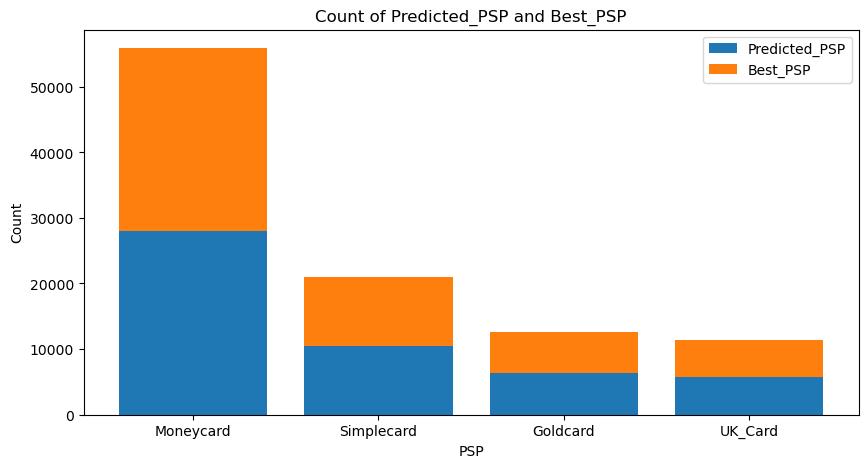

In [82]:
# Count occurrences of Predicted_PSP
predicted_psp_counts = df_2['Predicted_PSP'].value_counts()

# Count occurrences of Best_PSP
best_psp_counts = df_2['Best_PSP'].value_counts()

# Combine the counts into a DataFrame
matching_counts = pd.DataFrame({
'Predicted_PSP_Count': predicted_psp_counts,
'Best_PSP_Count': best_psp_counts
})

# Plot the count
plt.figure(figsize=(10, 5))
plt.bar(matching_counts.index, matching_counts['Predicted_PSP_Count'], label='Predicted_PSP')
plt.bar(matching_counts.index, matching_counts['Best_PSP_Count'], label='Best_PSP', bottom=matching_counts['Predicted_PSP_Count'])
plt.xlabel('PSP')
plt.ylabel('Count')
plt.title('Count of Predicted_PSP and Best_PSP')
plt.legend()
plt.show()